In [7]:
%load_ext watermark
%watermark -v -m  -u -n -p pandas,numpy,matplotlib,sklearn,seaborn,topicpy -a Filippo_Valle -g -r -b -w

Filippo_Valle 
last updated: Tue Jul 28 2020 

CPython 3.7.6
IPython 7.15.0

pandas 1.0.4
numpy 1.18.5
matplotlib 3.2.1
sklearn 0.0
seaborn 0.10.1
topicpy 1.1.1

compiler   : GCC 7.5.0
system     : Linux
release    : 4.19.76-linuxkit
machine    : x86_64
processor  : x86_64
CPU cores  : 2
interpreter: 64bit
Git hash   : 8346f75db29e2312ed93e88d34c107cc0bc3f0dd
Git repo   : git@github.com:fvalle1/cancers
Git branch : develop
watermark 2.0.2


In [6]:
import requests as rq
import json
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.cm as cm
from sklearn import metrics
import seaborn as sns
import os,sys
sys.path.append(os.getcwd())

from topicpy.hsbmpy import get_max_available_L, clusteranalysis, get_file, get_tissue_style

# Breast

## Load results

In [4]:
level = 1
algorithm = 'topsbm'
directory = "breast"
L=get_max_available_L(directory, algorithm)
df_clusters = pd.read_csv("%s/%s/%s_level_%d_clusters.csv"%(directory,algorithm,algorithm,L), header=[0])
df_clusters.head()

,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7,Cluster 8
0,87fcecde-b317-4518-bea1-cc8d14a18107.FPKM.txt.gz,8682197b-7b3d-4d3f-8f3d-8be702aa02fd.FPKM.txt.gz,8dfe19ae-aec1-4de5-9b94-1a48c05c11c5.FPKM.txt.gz,c592e62e-5de0-4c40-8e4c-f56b9546a545.FPKM.txt.gz,899a4fae-569f-463c-8cb1-049b9d50b9f4.FPKM.txt.gz,97be5457-526d-42ee-ace4-d900b8c6fd5f.FPKM.txt.gz,b5dc51e7-76d4-480f-bc2f-a0fc74947c35.FPKM.txt.gz,55030097-d293-41e0-a554-38f40282b6dc.FPKM.txt.gz
1,eaf65f67-8d04-49ec-8bf6-883237d6e67e.FPKM.txt.gz,e1877a07-b5ec-4ada-89cb-525e5abf966a.FPKM.txt.gz,1d102e83-ede2-460e-ab2e-f42d8db6970e.FPKM.txt.gz,cf7e72eb-b82f-44c8-894c-3995571ffe81.FPKM.txt.gz,446db9e9-d5aa-48ba-a84d-cf6a7d8f8fc4.FPKM.txt.gz,9f0d673f-ff69-4d01-910c-f04921b538a2.FPKM.txt.gz,1651f9c4-219f-4d46-adcc-6003c91eb059.FPKM.txt.gz,d5f0ea64-6660-49ac-a37e-3cd747045147.FPKM.txt.gz
2,c64c76e7-635c-458e-a032-07775aeb03d9.FPKM.txt.gz,205e7e19-1169-41a2-ac34-f8e1088e1015.FPKM.txt.gz,a6f657a3-439e-4afd-be04-413f2ed02828.FPKM.txt.gz,ca223822-8759-42a7-8058-ccd90a02320f.FPKM.txt.gz,70029e42-3b29-48f5-908e-7cd203103277.FPKM.txt.gz,b033c85a-2395-4ced-a84d-ac1fbce674bf.FPKM.txt.gz,0733fd68-9cd5-440a-a849-fb14ef76c00d.FPKM.txt.gz,NaN
3,b8e564b0-affd-4137-a10c-be4fe254a905.FPKM.txt.gz,bceffa81-996d-4775-a452-23b31a25daf9.FPKM.txt.gz,f641a19d-8497-4bc7-9df1-5228adfd5334.FPKM.txt.gz,bdd8c340-250b-474a-8802-7653b7884ced.FPKM.txt.gz,dc0592cf-5a96-4aed-86b2-eb7de5492b7c.FPKM.txt.gz,07d9b7c5-d77b-4b89-8c65-10e98149bdeb.FPKM.txt.gz,0f5282f4-e702-41f2-b93f-a1966203879f.FPKM.txt.gz,NaN
4,9bfd1930-f3c9-48f2-8b02-4d01b70b4ea0.FPKM.txt.gz,1f853089-c40d-4bee-9833-837f327b275a.FPKM.txt.gz,111d998f-4133-436a-9990-64cb293a986e.FPKM.txt.gz,23f8f5e2-25b8-4b43-b939-66e7e3f55977.FPKM.txt.gz,7af2075c-0386-4971-ae25-375330ef6cec.FPKM.txt.gz,ba08bef5-b401-4327-8923-bd5cfe44bb11.FPKM.txt.gz,d6b9e128-8f20-43a1-9d16-b3e2b3d60e34.FPKM.txt.gz,NaN


In [8]:
df_files = pd.read_csv("%s/files.dat"%directory, index_col=[0], header=[0]).dropna(axis=1, how='all').dropna(axis=0, how='all')
samples = pd.read_csv("%s/%s/%s_level_0_clusters.csv"%(directory,algorithm,algorithm), header=[0]).astype(str).values.ravel()
samples=samples[samples!="nan"]
df_files = df_files.reindex(index=samples).dropna(how="all", axis=0).fillna("unknown")
labels = df_files.columns
labels

Index(['cases.0.submitter_id', 'cases.0.diagnoses.0.primary_diagnosis',
       'cases.0.diagnoses.0.morphology',
       'cases.0.diagnoses.0.tissue_or_organ_of_origin',
       'cases.0.diagnoses.0.tumor_grade', 'cases.0.diagnoses.0.tumor_stage',
       'cases.0.project.disease_type', 'cases.0.project.primary_site',
       'Tumor.Type', 'Included_in_previous_marker_papers', 'vital_status',
       'days_to_birth', 'days_to_death', 'days_to_last_followup',
       'age_at_initial_pathologic_diagnosis', 'pathologic_stage',
       'BRCA_Pathology', 'BRCA_Subtype_PAM50', 'CNV Clusters',
       'Mutation Clusters', 'DNA.Methylation Clusters', 'mRNA Clusters',
       'miRNA Clusters', 'lncRNA Clusters', 'Protein Clusters',
       'PARADIGM Clusters', 'Pan-Gyn Clusters', 'birth_year', 'death_year',
       'age', 'age_binned', 'BRCA_Subtype_PAM50_Lum', 'cancer.type',
       'Subtype_mRNA', 'Subtype_Selected', 'Subtype_Selected_Lum'],
      dtype='object')

In [9]:
labels=['Subtype_Selected', 'Subtype_Selected_Lum', 'BRCA_Subtype_PAM50', 'BRCA_Subtype_PAM50_Lum']

True Subtype_Selected_Lum 3


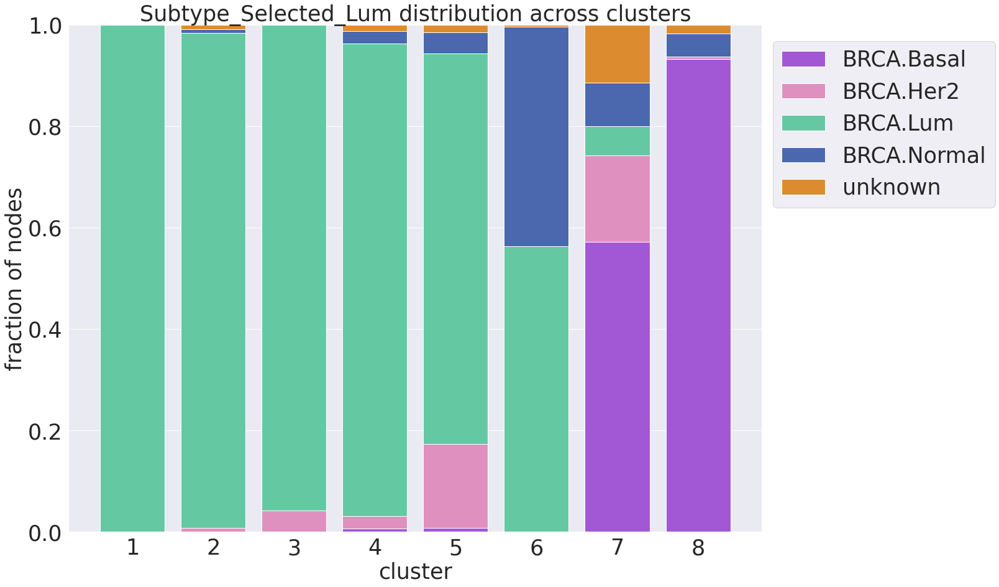

True Subtype_Selected_Lum 2


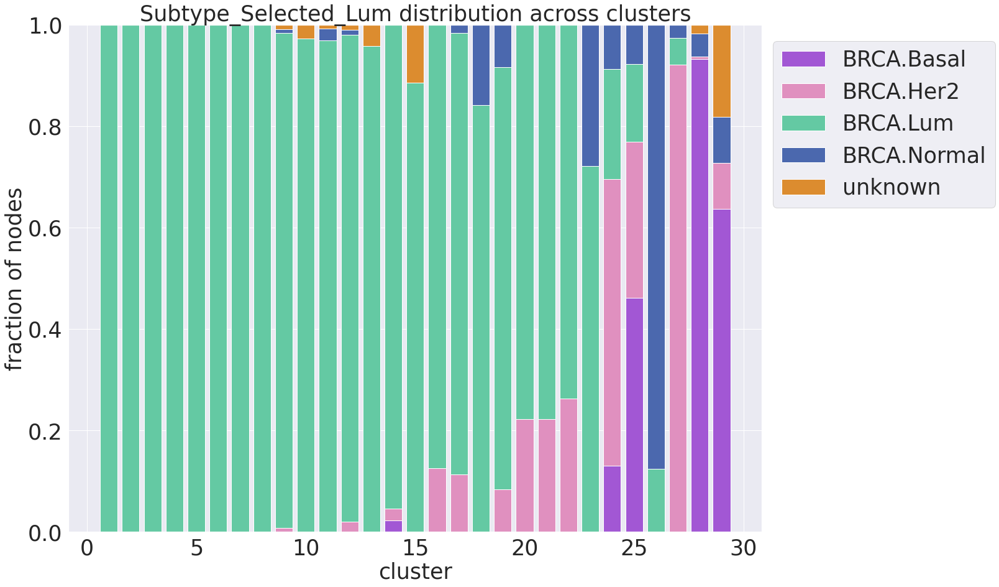

True Subtype_Selected_Lum 1


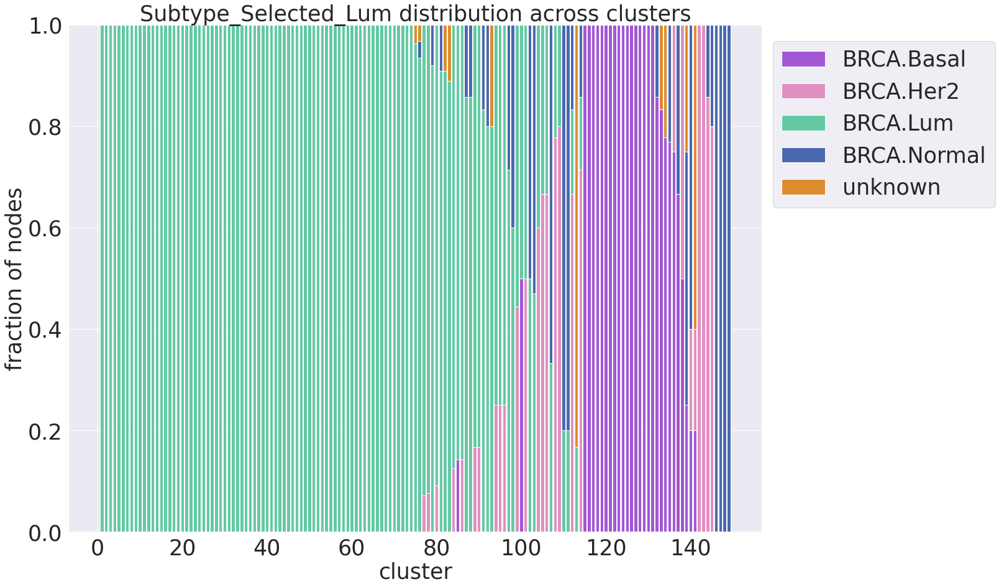

True Subtype_Selected_Lum 0
True BRCA_Subtype_PAM50 3


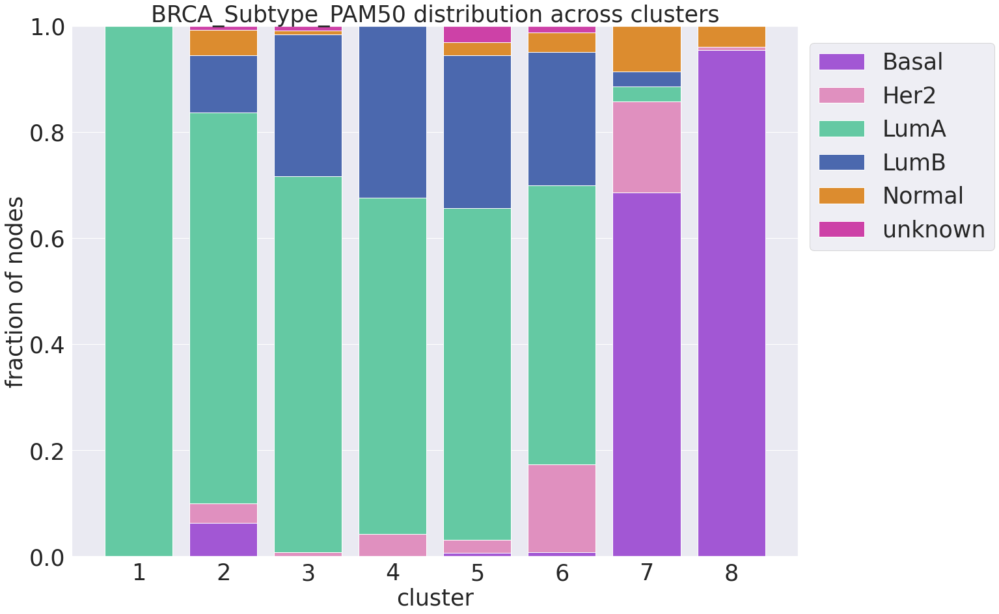

True BRCA_Subtype_PAM50 2


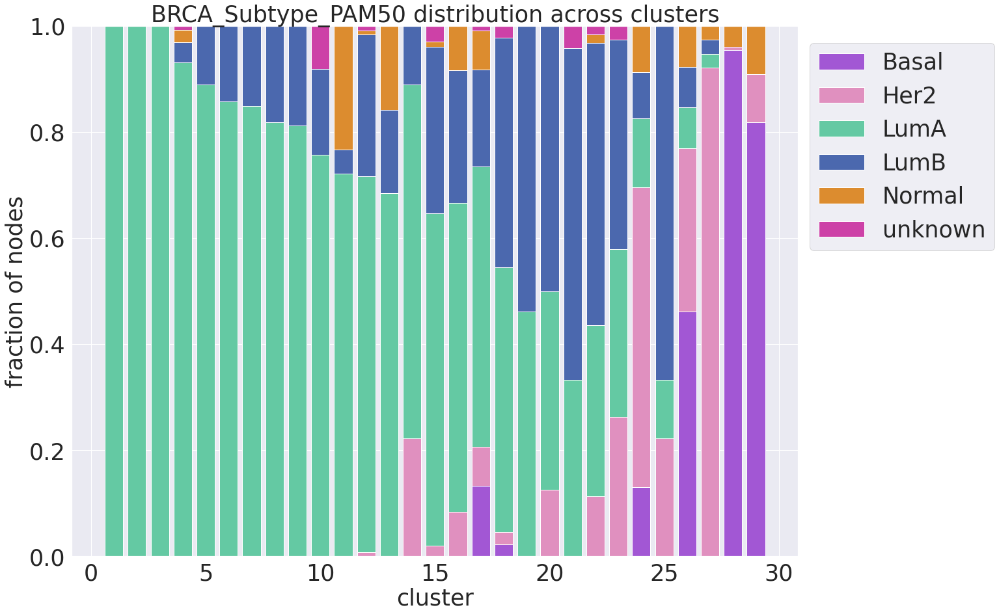

True BRCA_Subtype_PAM50 1


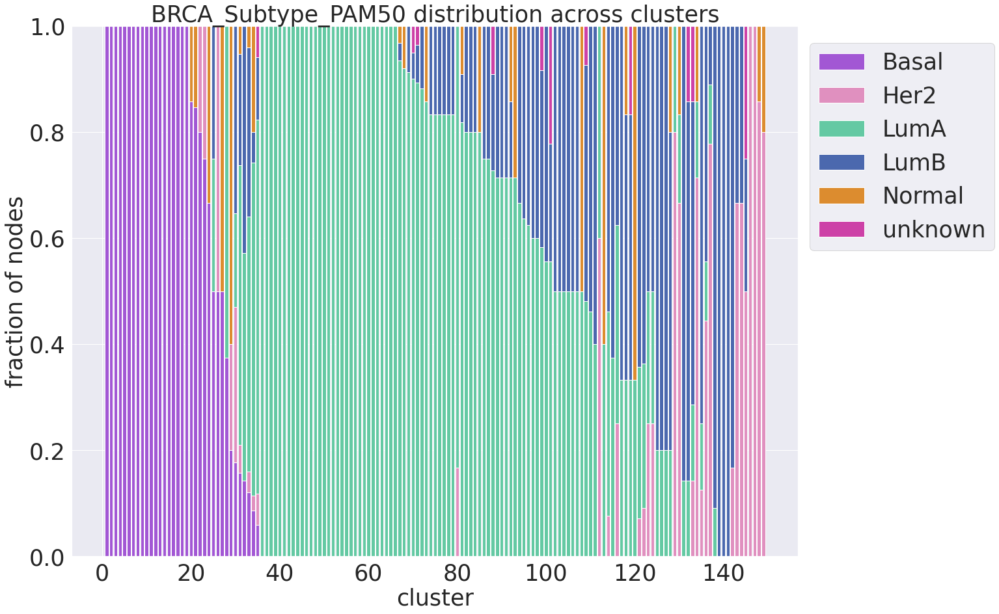

True BRCA_Subtype_PAM50 0
False Subtype_Selected_Lum 3


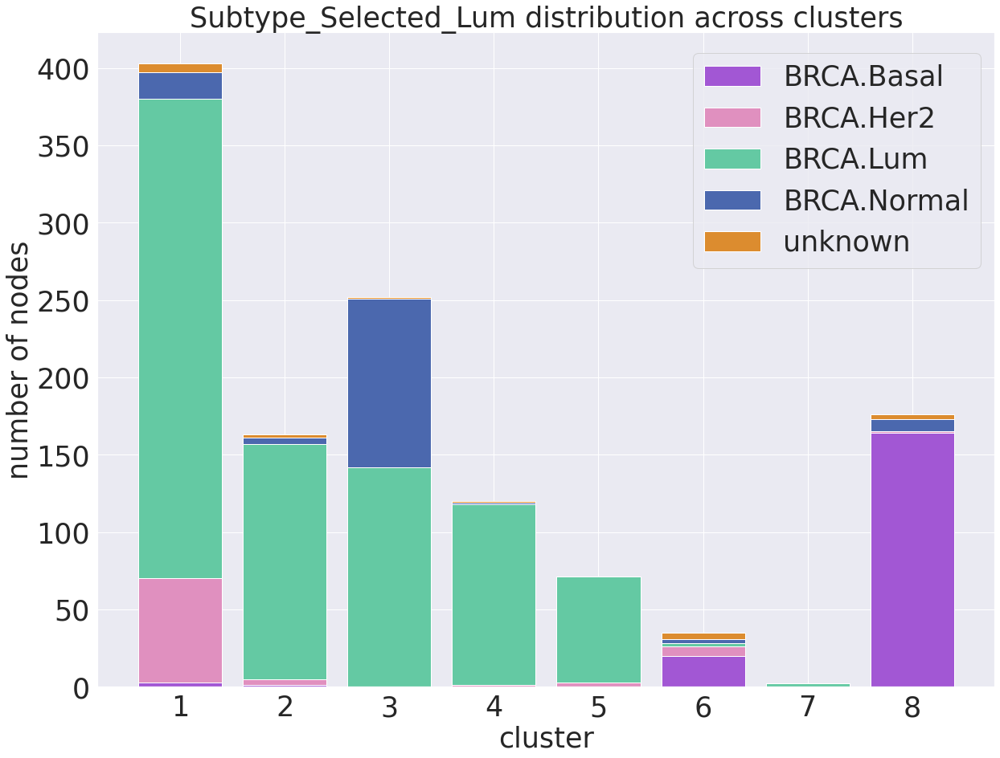

False Subtype_Selected_Lum 2


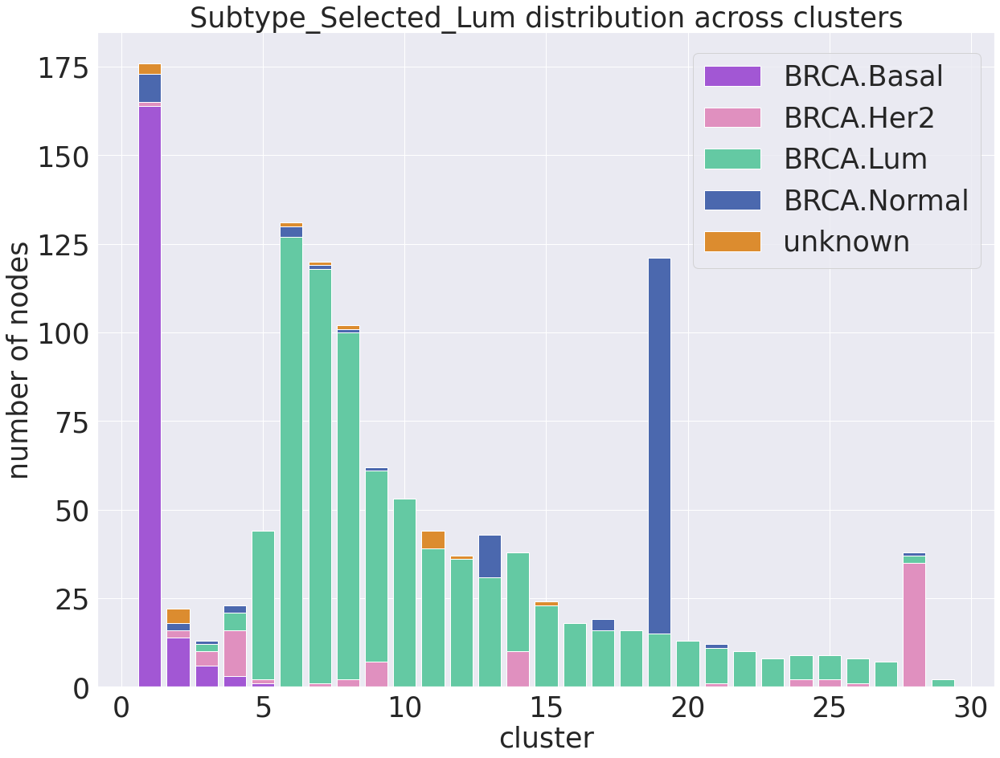

False Subtype_Selected_Lum 1


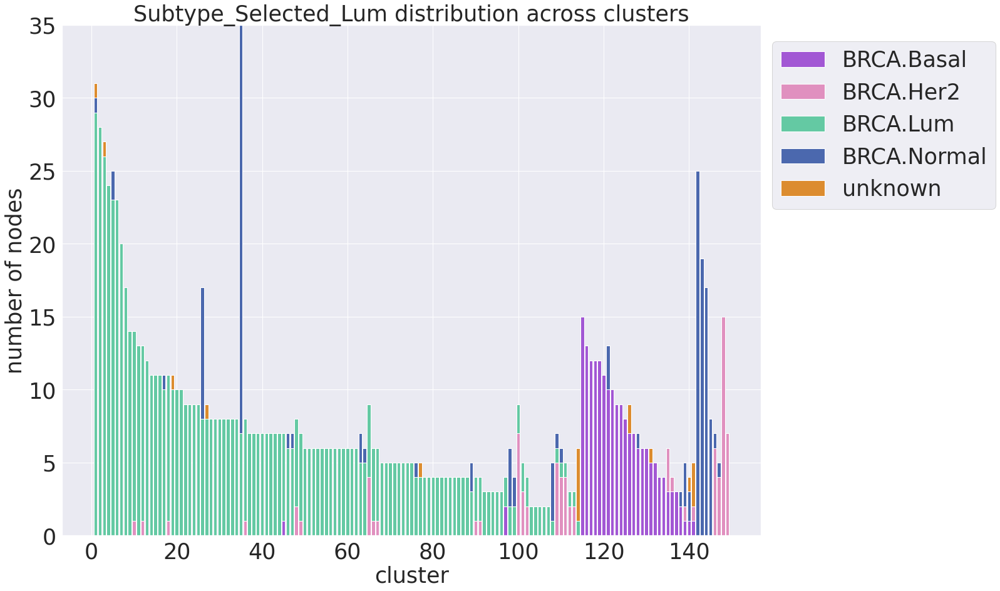

False Subtype_Selected_Lum 0
False BRCA_Subtype_PAM50 3


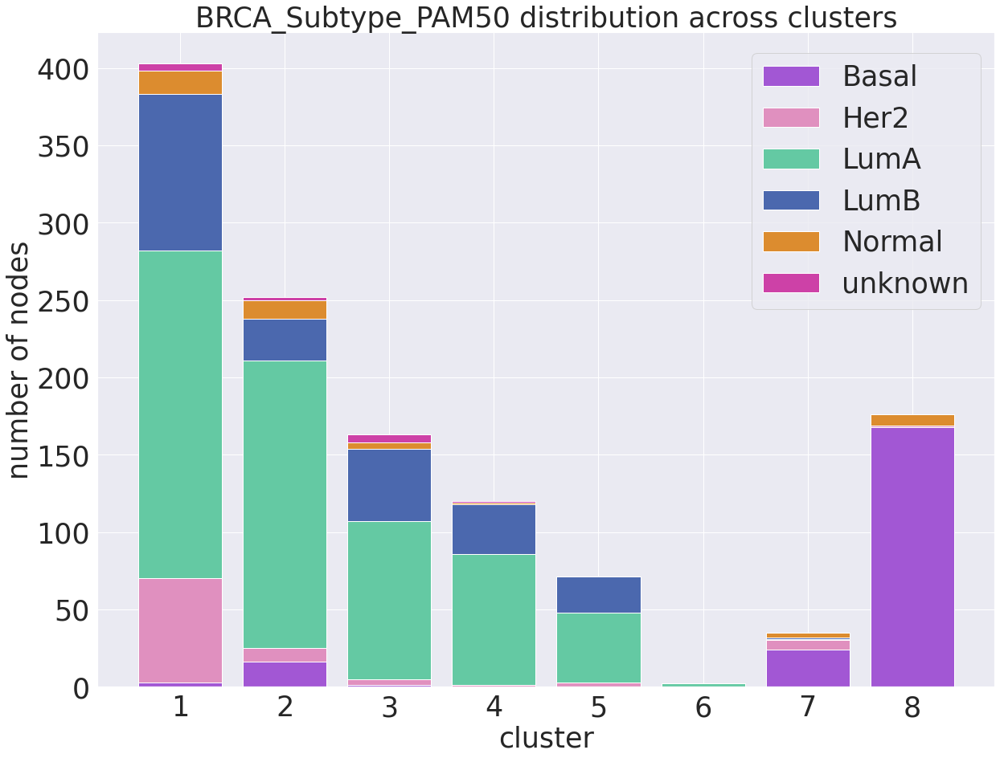

False BRCA_Subtype_PAM50 2


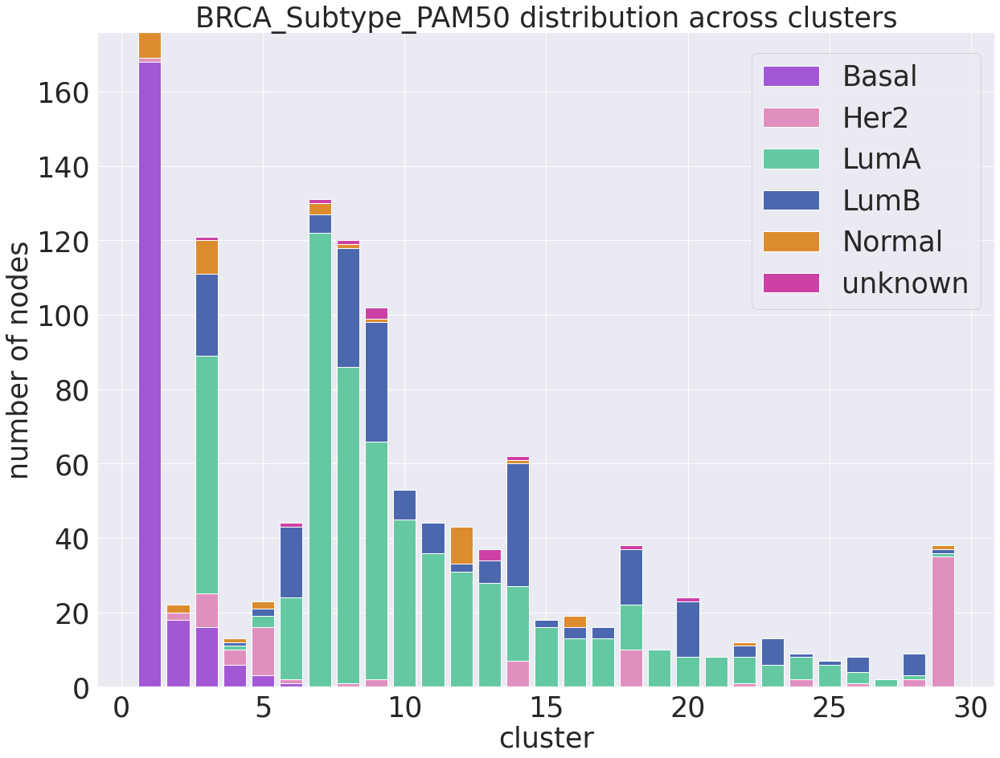

False BRCA_Subtype_PAM50 1


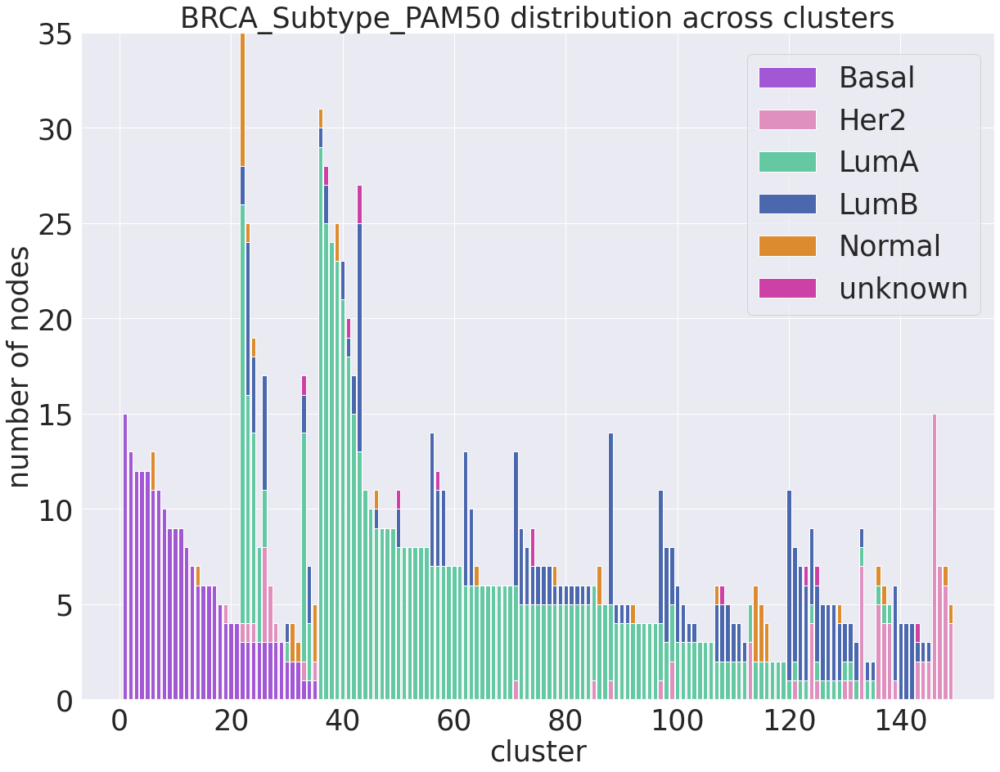

False BRCA_Subtype_PAM50 0


In [6]:
clusteranalysis(directory, labels)

## Plot tree

The next cell creates a file to load with [tree_plotter/plot_tree.ipynb](tree_plotter/plot_tree.ipynb)

Please change there the following line to read the file we're going to create
```python
df_hier = pd.read_csv("../breast/topsbm/topsbm_labels.csv")
```

In [7]:
def reindex(x):
    i=0
    last=x[0]
    new = []
    for xi in x:
        if xi == last:
            pass
        else:
            i+=1
            last=xi
        new.append(i)
    return new

from hsbmpy import get_file

df_labels = pd.DataFrame()
shape = df_clusters.dropna().shape
files = pd.read_csv("%s/%s/%s_level_3_clusters.csv"%(directory,algorithm,algorithm), header=[0]).astype(str).values.ravel()
files = files[files!="nan"]

for level in np.arange(L+1)[::-1]:
    df_clusters = pd.read_csv("%s/%s/%s_level_%d_clusters.csv"%(directory,algorithm,algorithm,level), header=[0])
    print("level ", level, "with ", df_clusters.shape[1], " clusters")
    currentlevellabels = []
    for file in files:
        s = df_clusters[df_clusters.isin([file])].any(0)
        a = s.index[s]
        currentlevellabels.append(int(a[0][8:])-1)
    df_labels.insert(0,'l%d'%level,currentlevellabels)
    del currentlevellabels
filelabels = []
filesublabels = []
for file in files:
    try:
        filelabels.append(get_file(file, df_files)[labels[0]])
    except:
        filelabels.append('unknown')
        print(*sys.exc_info())
    try:
        filesublabels.append(get_file(file, df_files)[labels[1]])
    except:
        filesublabels.append('unknown')
df_labels.insert(0,'tissue', filelabels)
df_labels.insert(0,'subtissue', filesublabels)
df_labels.sort_values(by=['tissue','subtissue'], inplace=True)
df_labels.sort_values(by=["l%d"%l for l in np.arange(L+1)[::-1]], axis=0, inplace=True)
filelabels = df_labels['tissue']
filesublabels = df_labels['subtissue']
df_labels = df_labels.apply(reindex, axis=0)
df_labels['tissue']=filelabels
df_labels['subtissue']=filesublabels
df_labels.to_csv("%s/%s/topsbm_labels.csv"%(directory,algorithm), index=False, header=True)

level  3 with  8  clusters
level  2 with  29  clusters
level  1 with  149  clusters
level  0 with  1204  clusters


## Scores

In [ ]:
from topicpy.hsbmpy import get_scores, get_scores_shuffled

labels = ["Subtype_Selected_Lum", "BRCA_Subtype_PAM50_Lum"]

scores = dict()
scores["hsbm"] = get_scores(directory, labels, algorithm = "topsbm", verbose=False)[labels[0]]
scores["lda"] = get_scores(directory, labels, algorithm = "lda", verbose=False)[labels[0]]
scores["hierarchical"] = get_scores(directory, labels, algorithm = "hierarchical-log", verbose=False)[labels[0]]
scores["wgcna"] = get_scores(directory, labels, algorithm = "wgcna", verbose=False)[labels[0]]
scores['shuffle'] = get_scores_shuffled(directory, df_files, label=labels[0], algorithm='topsbm')

In [189]:
scores["tissues"] = get_scores(directory, labels, algorithm='topsbm', verbose=False)[labels[0]]
scores["sub_tissues"] = get_scores(directory, labels, algorithm='topsbm', verbose=False)[labels[1]]
scores[labels[0]] = scores["tissues"]
scores[labels[1]] = scores["sub_tissues"]

In [196]:
from topicpy.hsbmpy import normalise_score
if "mixed" in scores.keys():
    scores.pop("mixed")
norm_scores = scores.copy()
normalise_score(norm_scores, base_algorithm="shuffle")

In [197]:
analyses = {
    "all": ['hsbm', 'hierarchical', 'lda', 'wgcna', 'shuffle'],
    "subtypes": ["Subtype_Selected", "BRCA_Subtype_PAM50",'shuffle'],
    "subtissues": ["tissues", "sub_tissues",'shuffle']
}

In [195]:
import importlib,hsbmpy
importlib.reload(hsbmpy)

<module 'hsbmpy' from '/home/jovyan/work/phd/cancers/hsbmpy.py'>

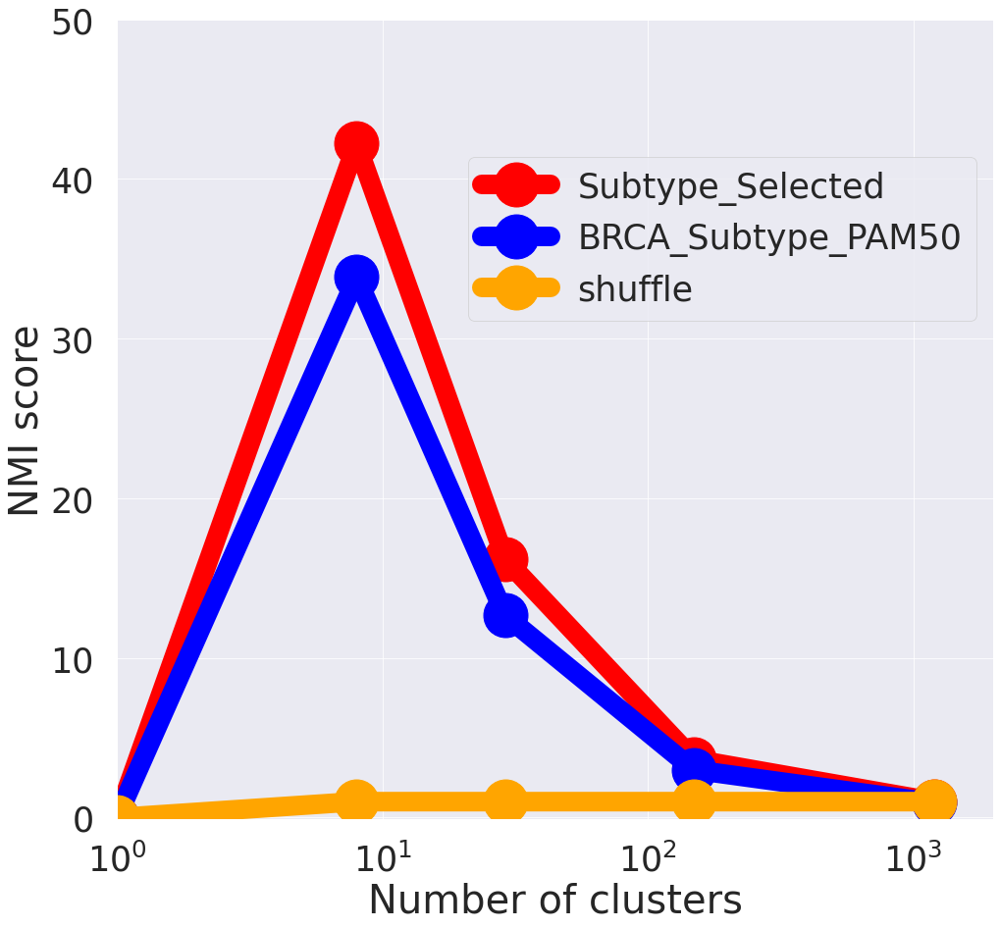

In [200]:
analysis = "subtypes"

from topicpy.hsbmpy import add_score_lines

fig=plt.figure(figsize=(20,15))
ax = fig.subplots(1)
add_score_lines(ax,scores, V="norm_V", labels=analyses[analysis])
plt.xlim(1,2000)
plt.ylim(-0.1,50)
plt.show()
fig.savefig("%s/metric_scores_%s.pdf"%(directory,analysis))

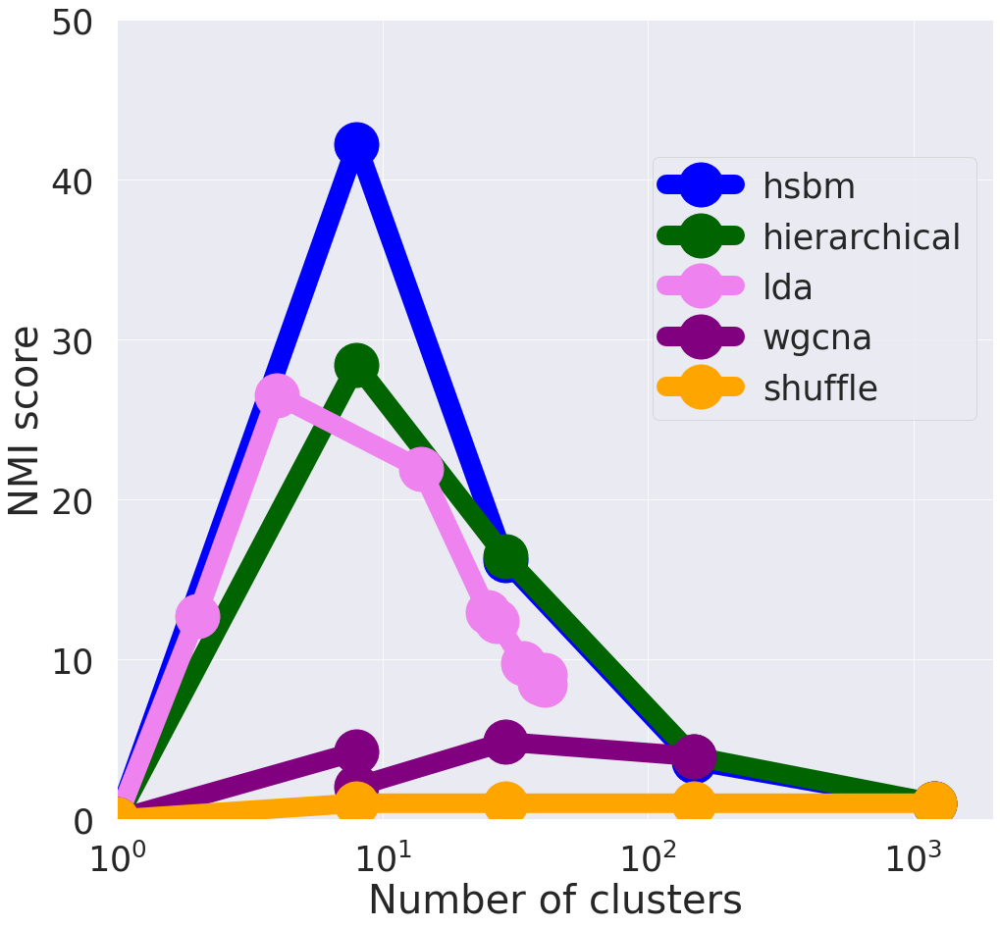

In [201]:
analysis = "all"

fig=plt.figure(figsize=(20,15))
ax = fig.subplots(1)
add_score_lines(ax,scores, V="norm_V", labels=analyses[analysis])
plt.xlim(1,2000)
plt.ylim(0,50)
plt.show()
fig.savefig("%s/metric_scores_%s.pdf"%(directory,analysis))

## Topic distributions

In [270]:
l = L-1

In [271]:
df_topics = pd.read_csv("%s/%s/%s_level_%d_topic-dist.csv"%(directory,algorithm,algorithm,l))
t_size = pd.read_csv("%s/%s/%s_level_%d_word-dist.csv"%(directory,algorithm,algorithm,l), index_col=0).apply(lambda topic: sum((topic>0).astype(int))).mean()
df_files = pd.read_csv("%s/files.dat"%directory, index_col=0).dropna(how='all', axis=0)
df_topics.set_index('doc', inplace=True)
df_topics.insert(0,'tissue','')
df_topics.drop('i_doc', axis=1, inplace=True)
label = "Subtype_Selected"
if label not in df_files.columns:
    raise AttributeError(f"{label} not valid. Available: {df_files.columns}")
print("Working at level %d with %d topics and average size: %d"%(l,df_topics.shape[1]-1, round(t_size)))

Working at level 2 with 41 topics and average size: 24


In [272]:
for sample in df_topics.index.values:
    try:
        df_topics.at[sample,'tissue']=("%s"%(get_file(sample,df_files)[label]))
    except:
        print(*sys.exc_info())
        print(sample)
        df_topics.at[sample,'tissue']="unknown"

In [273]:
df_cmap = df_topics.sort_values(by='tissue').set_index('tissue').transpose()
df_cmap = df_cmap.subtract(df_cmap.mean(axis=1),axis=0)
#create a color palette with the same number of colors as unique values in the Source column
network_pal = sns.color_palette('husl',n_colors=len(df_cmap.columns))

#Create a dictionary where the key is the category and the values are the
#colors from the palette we just created
network_lut = dict(zip(df_cmap.columns, network_pal))
network_col = df_cmap.columns.map(network_lut)

In [274]:
def get_box_data(topic):
    box_data = []
    tissues = df_cmap.columns.unique()
    for tissue in tissues:
        df_series = df_cmap.transpose().reset_index()[["tissue",topic]]
        df_series=df_series[df_series["tissue"]==tissue]
        box_data.append(df_series[topic].values)
    return box_data, tissues

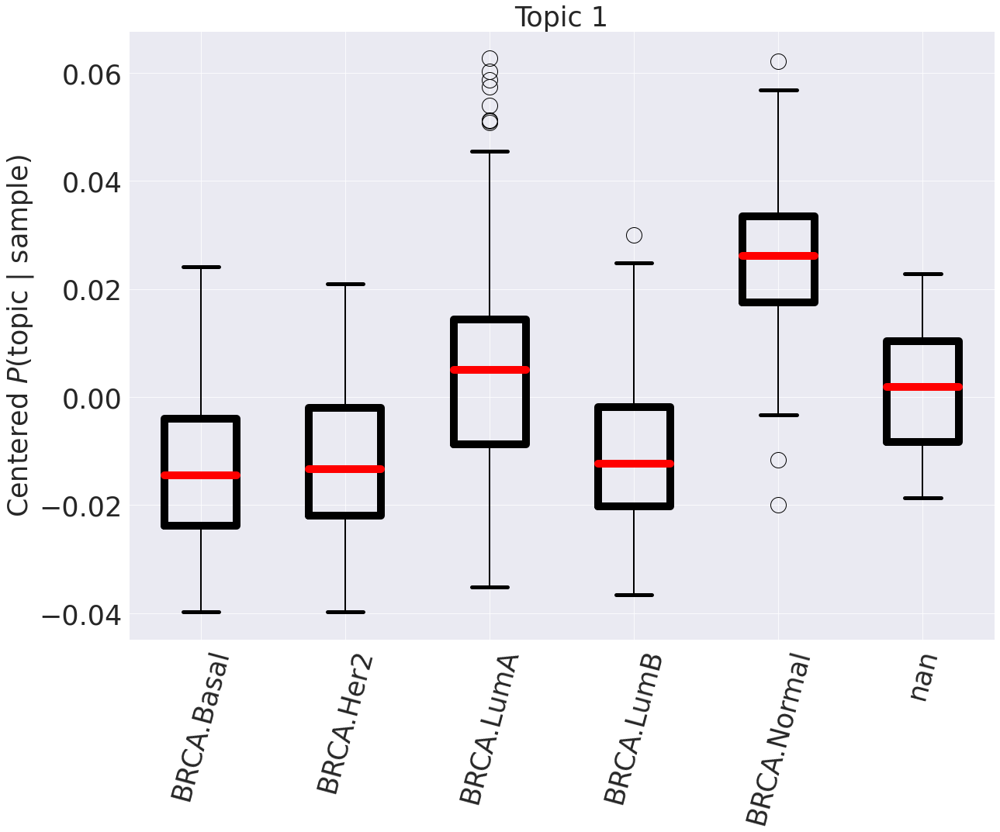

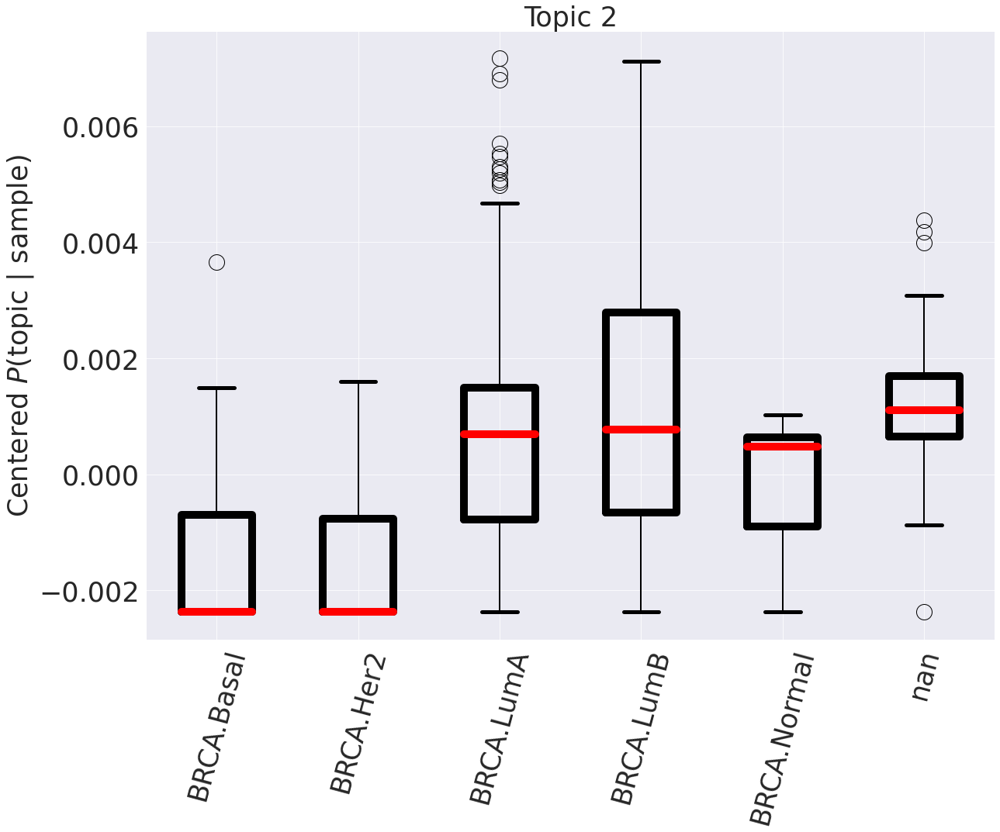

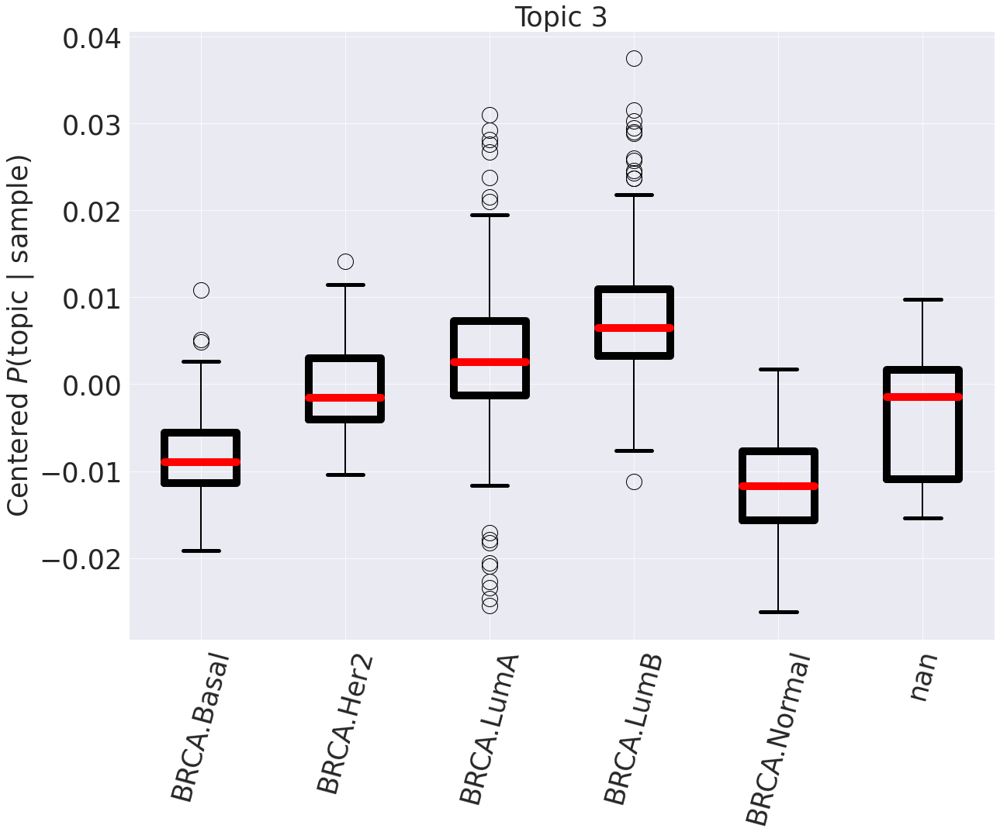

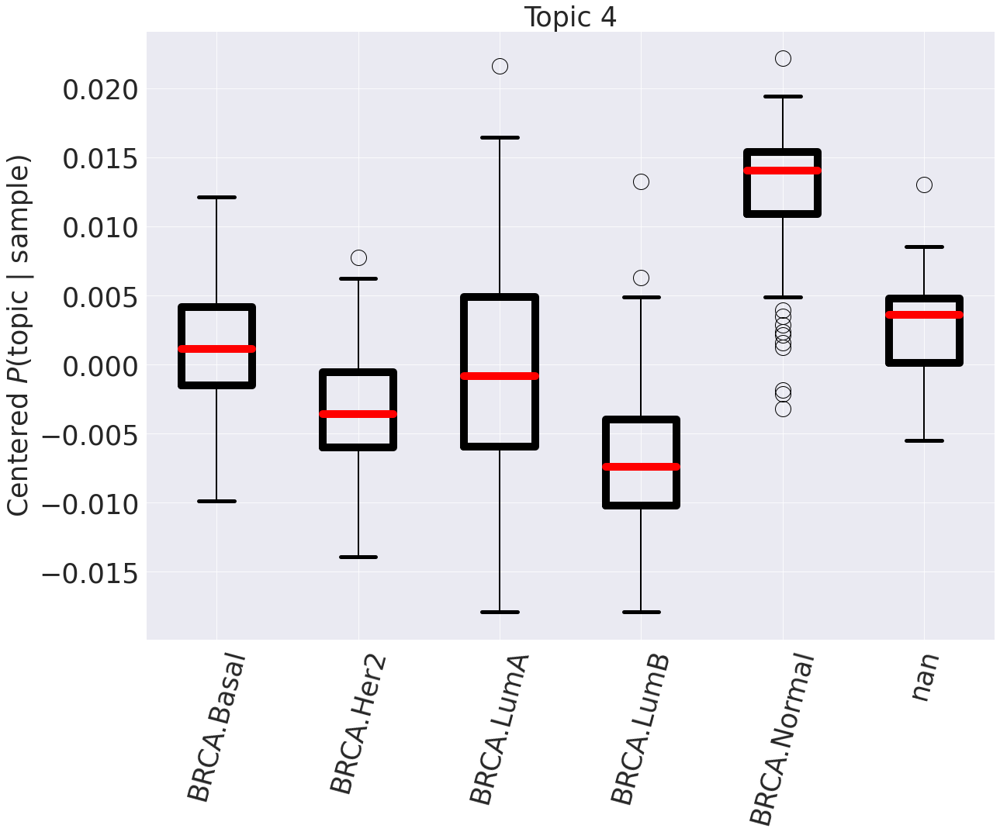

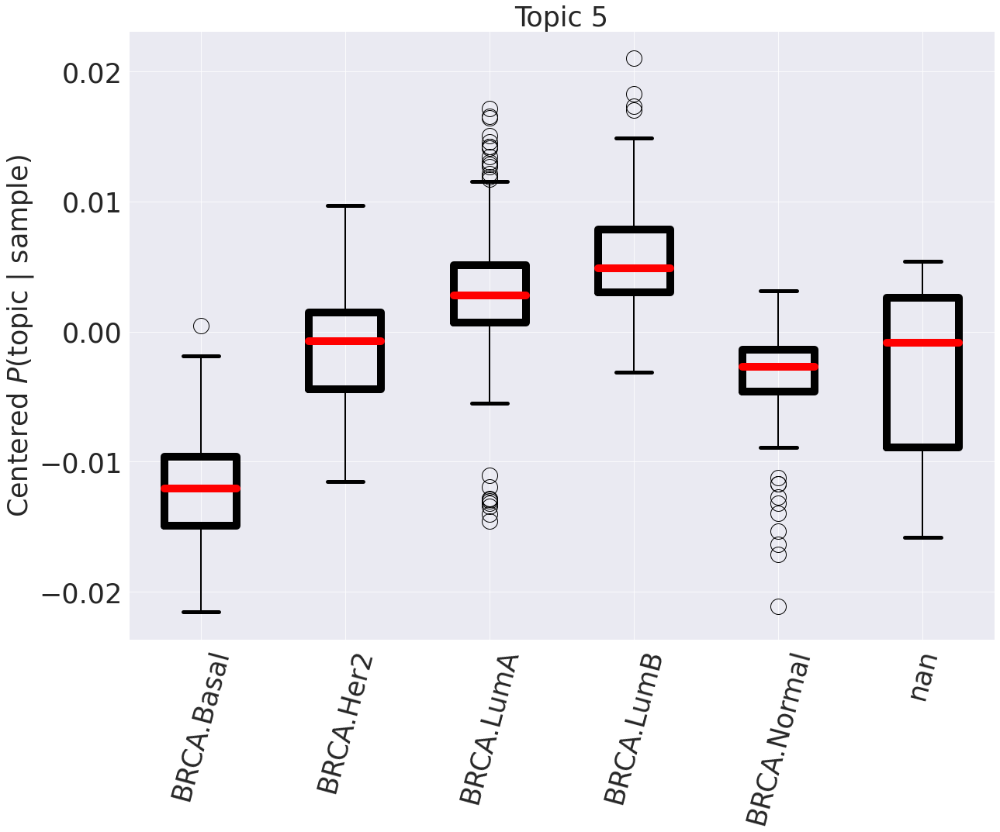

...

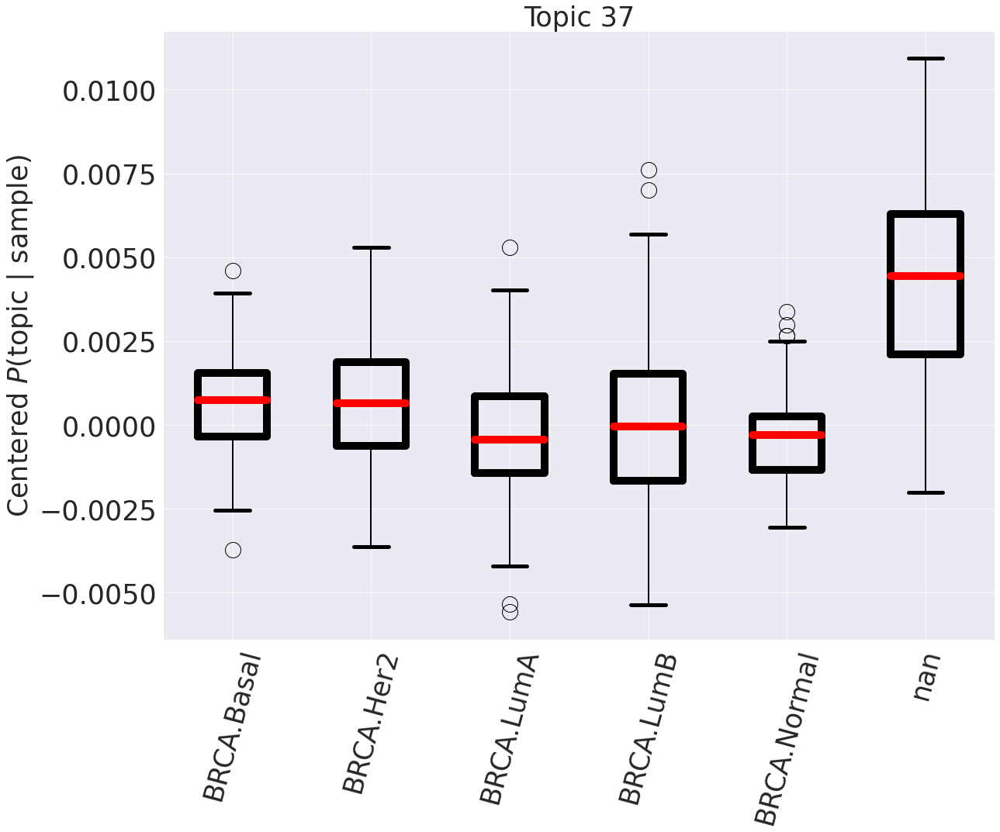

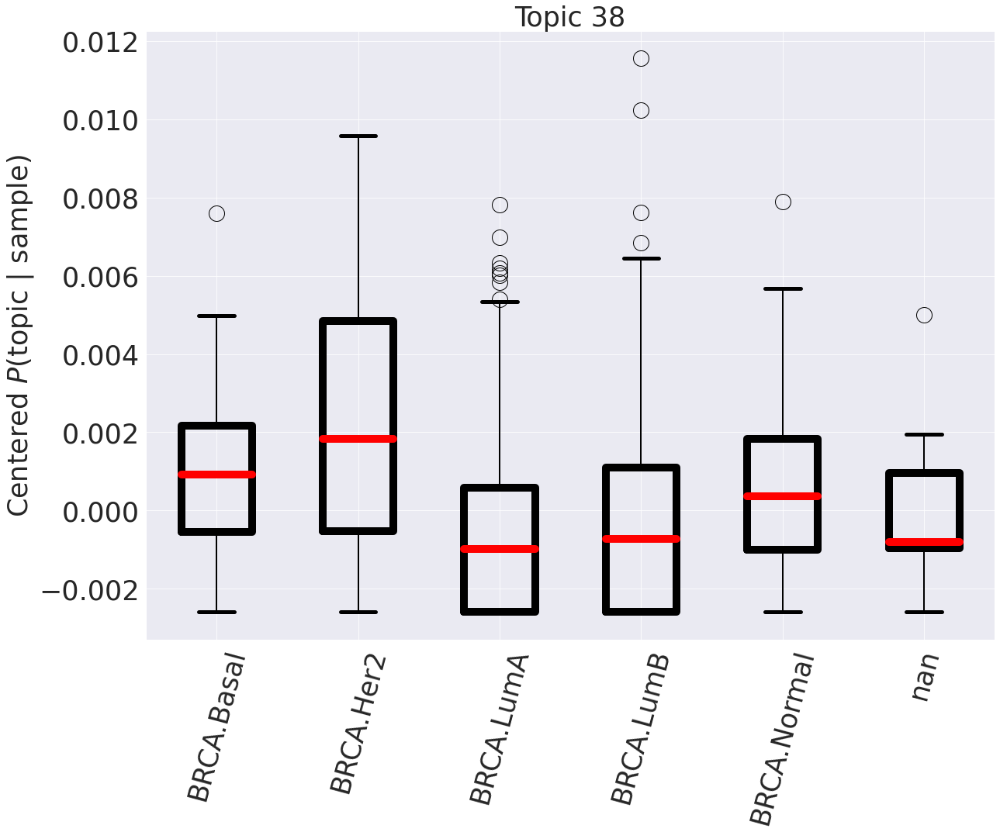

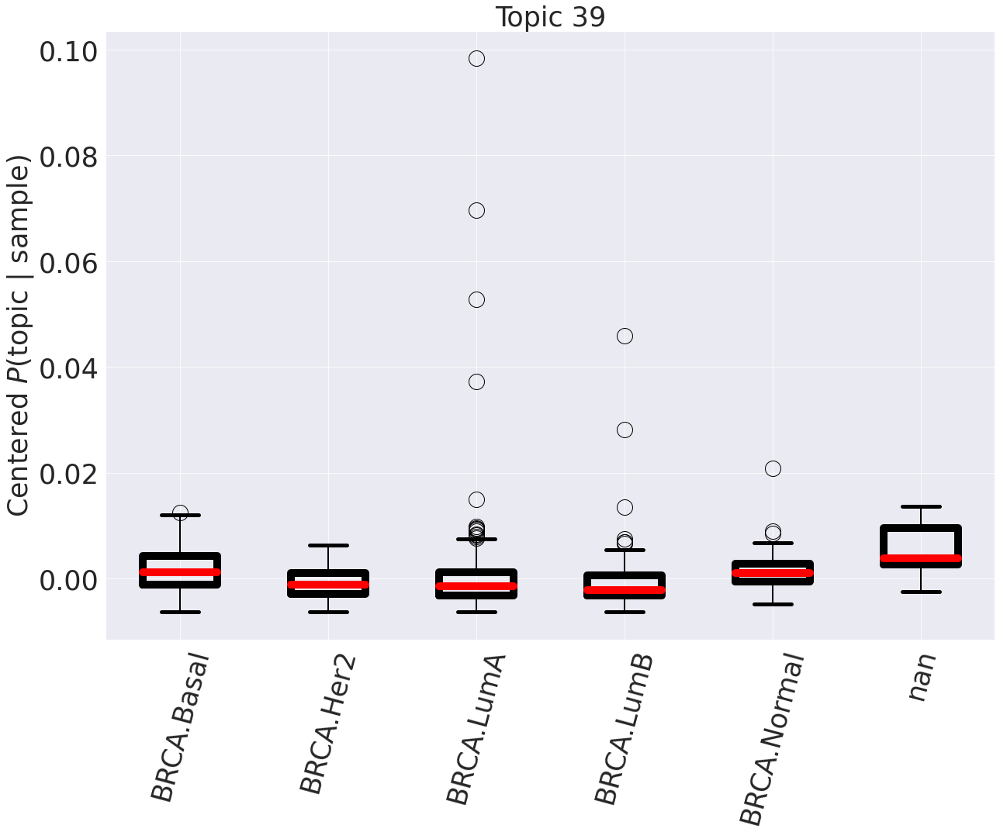

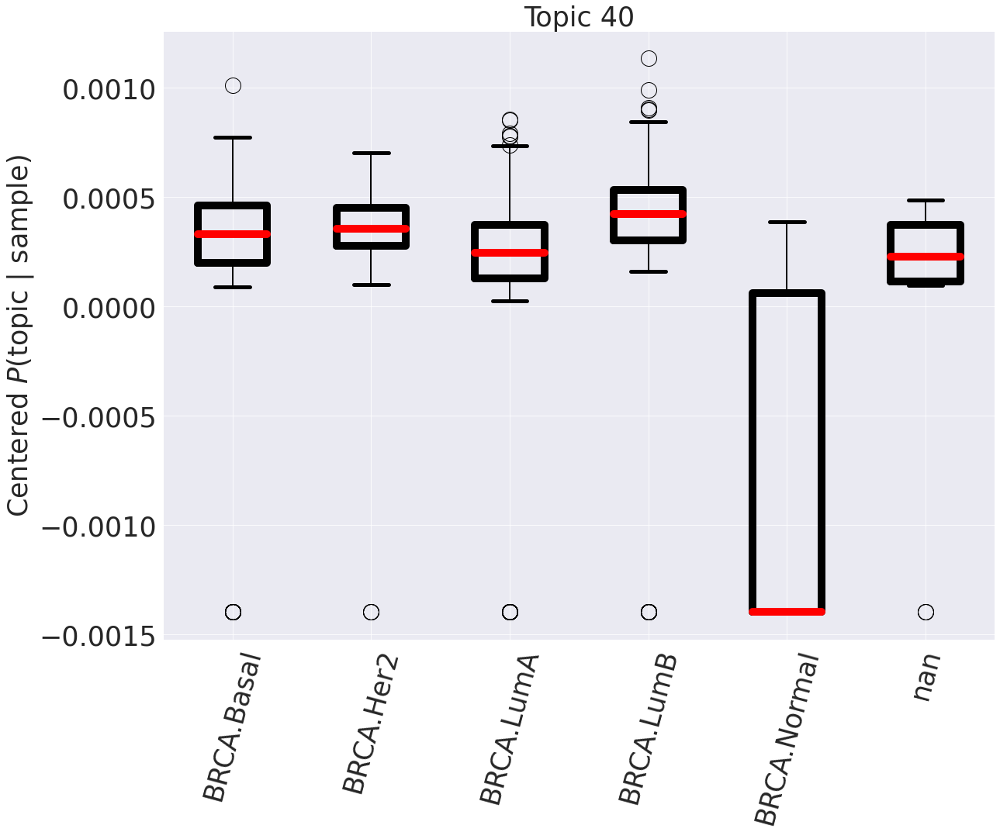

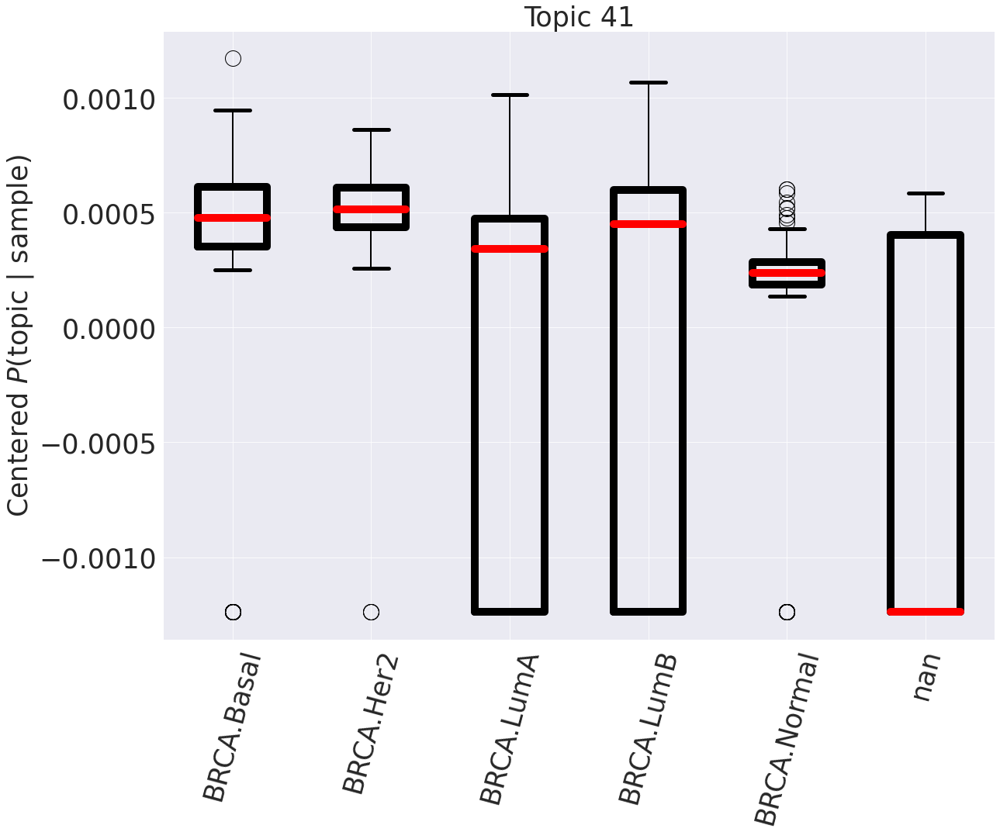

In [19]:
for topic in df_cmap.index: # all
    box_data, tissues = get_box_data(topic)

    fig, ax = plt.subplots(figsize=(18,15))
    ax.boxplot(box_data, sym="o", flierprops={"c":"gray", "ms":20, "lw":5}, boxprops = {"lw":10}, whiskerprops={"lw":2}, capprops={"lw":5}, medianprops={"c":"red", "lw":10})
    #ax.violinplot(box_data)
    
    ax.tick_params(labelsize=35)
    ax.set_title(topic, fontsize=35)

    ax.set_xticklabels(tissues, rotation = 75)
    ax.set_ylabel("Centered $P($topic $|$ sample$)$", fontsize=35)

    plt.tight_layout()
    fig.savefig(f"box_{algorithm}_{l}{topic}.pdf")
    plt.show()

In [275]:
df_topics = pd.read_csv("%s/%s/%s_level_%d_topic-dist.csv"%(directory,algorithm, algorithm,l))
df_topics.drop('i_doc', axis=1, inplace=True)
df_topics.set_index('doc', inplace=True)
order = df_topics.mean(0).sort_values(ascending=False)
df_topics = df_topics.reindex(columns=order.index)
df_topics.columns = ["Topic %d"%(t+1) for t,_ in enumerate(df_topics.columns)]
for sample in df_topics.index.values:
    df_topics.at[sample,'tissue']="%s"%(get_file(sample,df_files)[label])

BRCA.Basal
BRCA.Her2
BRCA.LumA
BRCA.LumB
BRCA.Normal
nan


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.


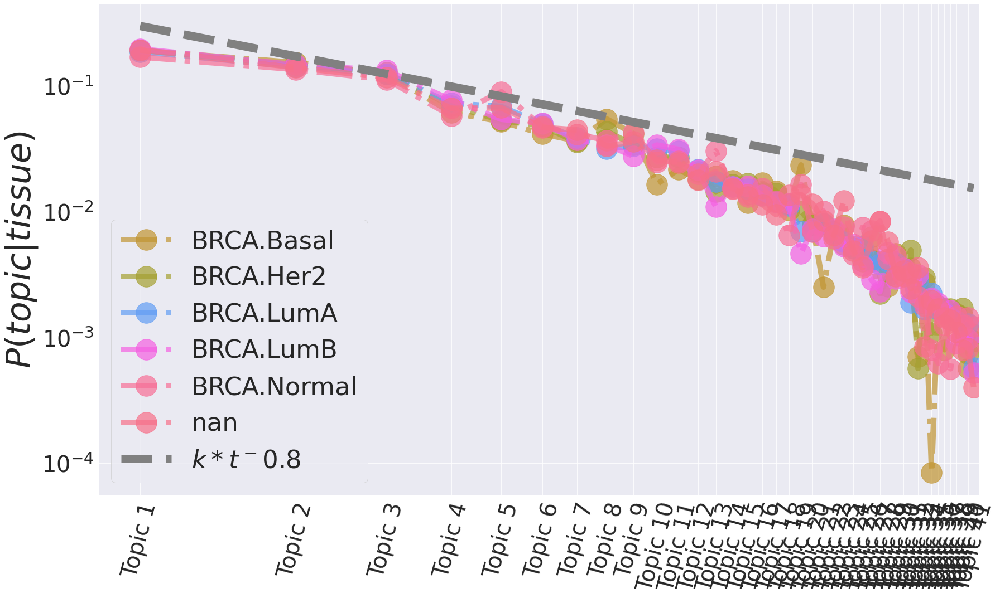

In [276]:
log = True

fig,ax = plt.subplots(figsize=(25,15))
for tissue in np.sort(df_topics['tissue'].unique()):
    print(tissue)
    marker, c, ls = get_tissue_style(tissue)
    try:
        ax.plot(np.arange(1, df_topics.shape[1],step=1),df_topics[df_topics['tissue']==tissue].mean(axis=0),ls=ls,marker=marker, lw=10, ms=75, alpha=0.7, label=tissue, c=network_lut[tissue])
    except:
        print(*sys.exc_info())
ax.set_ylabel("$P(topic | tissue)$", fontsize=60)
#plt.xscale('log')
#plt.yscale('log')

ax.set_xticks(np.arange(1, df_topics.shape[1],step=2))
ax.set_xticklabels(df_topics.columns[:-1:2], rotation=45)
ax.tick_params(labelsize=45)

if log:
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xticks(np.arange(1, df_topics.shape[1],step=1))
    ax.set_xticklabels(df_topics.columns[:-1], rotation=75)
    ax.tick_params(labelsize=40)
    ax.set_xlim(0,df_topics.shape[1])
    
    
ax.plot(np.arange(1, df_topics.shape[1]),3e-1*np.power(np.arange(1, df_topics.shape[1]),-0.8), lw=15, c="gray", ls="--", label="$k*t^-0.8$")
# Shrink current axis by 20%
#box = ax.get_position()
#ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
#ax.legend(fontsize=25, ncol=1, loc='center left', bbox_to_anchor=(1, 0.5))
ax.legend(fontsize=45, ncol=1, loc='best')


plt.tight_layout()
plt.show()
fig.savefig("%s/%s/lifeplot_level%d%s.pdf"%(directory,algorithm,l,"_log" if log else ""))

# Lung

## Load results

In [284]:
level = 1
algorithm = 'topsbm'
directory = "lung"
L=get_max_available_L(directory, algorithm)
df_clusters = pd.read_csv("%s/%s/%s_level_%d_clusters.csv"%(directory,algorithm,algorithm,L), header=[0])
df_clusters.head()

,Cluster 1,Cluster 2
0,dc0ce32f-d5aa-489f-ba4b-e01443815121.FPKM.txt.gz,b1558748-bec9-4bea-a35b-040ca9a1f4cd.FPKM.txt.gz
1,6d158f35-9847-41fd-814e-9bb63cca955f.FPKM.txt.gz,6f9413df-3cff-4e32-87a0-b3e891ffa786.FPKM.txt.gz
2,a22817b9-da0e-45cd-ba5d-3eb790e273cb.FPKM.txt.gz,15975c7c-40b7-4782-a4e8-a484f11ac63f.FPKM.txt.gz
3,f204f6b8-03fb-4464-922d-de9fffeff9d5.FPKM.txt.gz,840bb854-0669-485e-9d83-c4e1e4f10626.FPKM.txt.gz
4,b2bd3b9d-2380-47bb-a13d-a4e7a00d6740.FPKM.txt.gz,dc76cdde-f77f-4604-94c4-0b150b9a56b4.FPKM.txt.gz


In [285]:
df_files = pd.read_csv("%s/files.dat"%directory, index_col=[0], header=[0]).dropna(axis=1, how='all').dropna(axis=0, how='all')
samples = pd.read_csv("%s/%s/%s_level_0_clusters.csv"%(directory,algorithm,algorithm), header=[0]).astype(str).values.ravel()
samples=samples[samples!="nan"]
df_files = df_files.reindex(index=samples).dropna(how="all", axis=0).fillna("unknown")
labels = df_files.columns
labels

Index(['cases.0.submitter_id', 'cases.0.diagnoses.0.morphology',
       'cases.0.diagnoses.0.primary_diagnosis',
       'cases.0.diagnoses.0.tissue_or_organ_of_origin',
       'cases.0.diagnoses.0.tumor_grade', 'cases.0.diagnoses.0.tumor_stage',
       'cases.0.project.disease_type', 'cases.0.project.primary_site',
       'cases.0.samples.0.longest_dimension',
       'cases.0.samples.0.portions.0.analytes.0.aliquots.0.submitter_id',
       'cancer.type', 'Subtype_mRNA', 'Subtype_DNAmeth', 'Subtype_Integrative',
       'Subtype_Selected'],
      dtype='object')

In [286]:
labels=['cancer.type']

True cancer.type 2


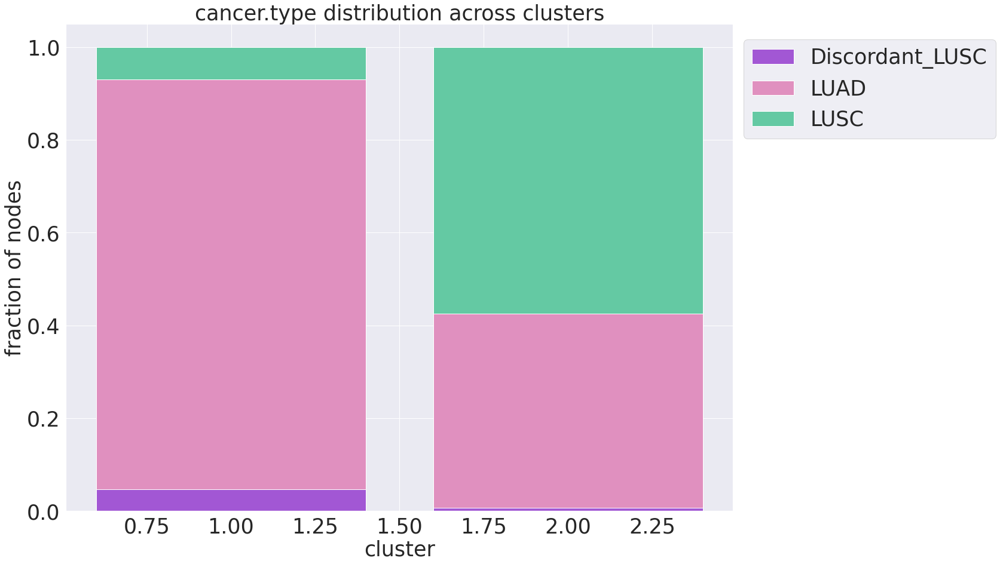

True cancer.type 1


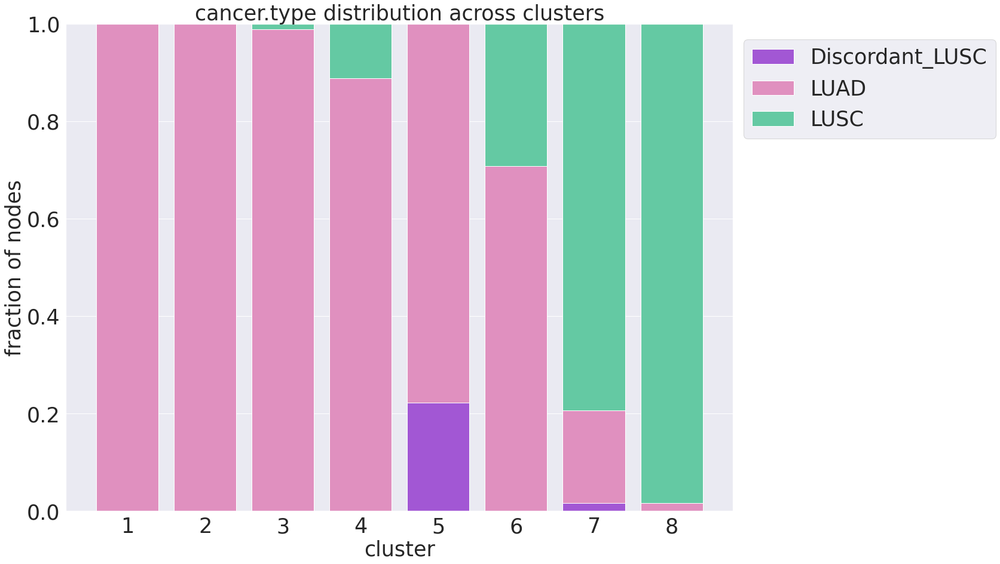

True cancer.type 0


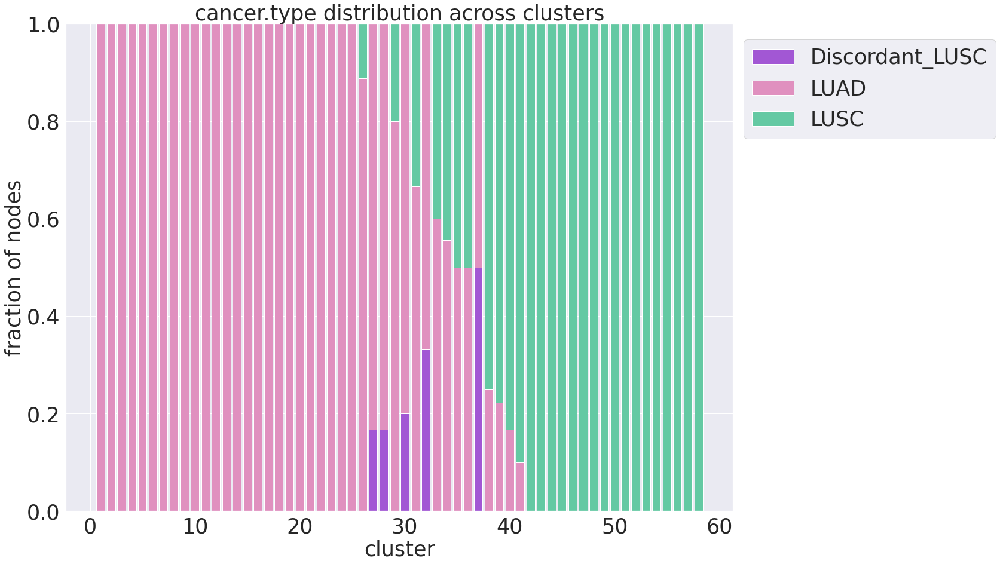

False cancer.type 2


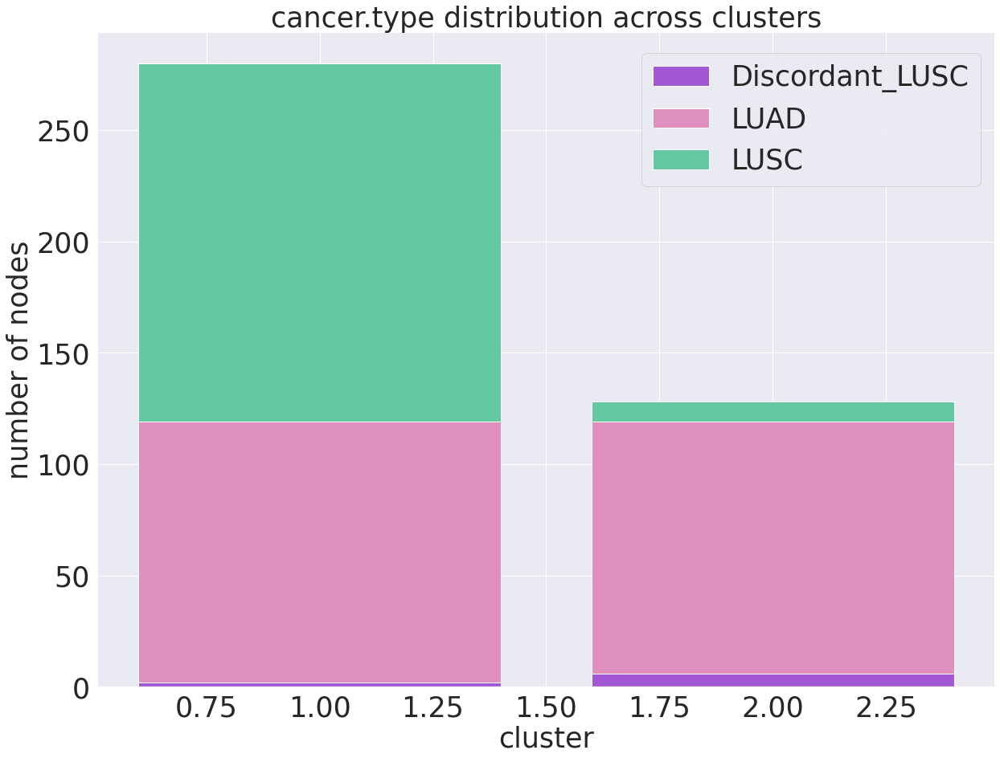

False cancer.type 1


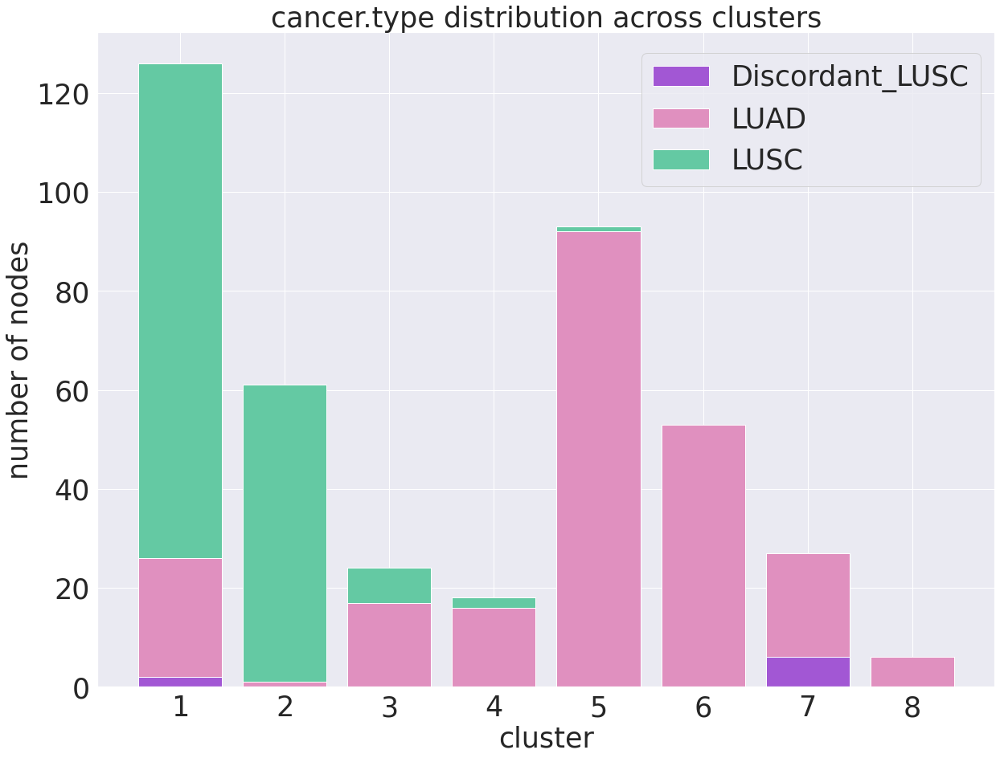

False cancer.type 0


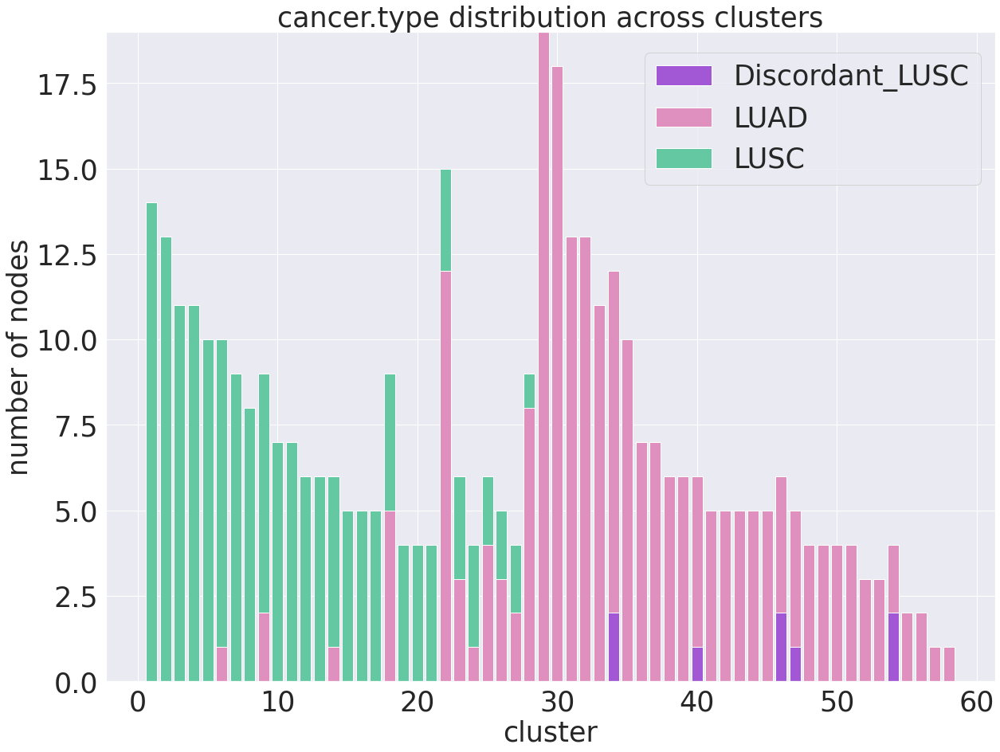

In [16]:
clusteranalysis(directory, labels)

## Scores

In [303]:
from hsbmpy import get_scores, get_scores_shuffled

labels = ["cancer.type", "Subtype_Selected"]

scores = dict()
scores["hsbm"] = get_scores(directory, labels, algorithm = "topsbm", verbose=False)[labels[0]]
scores["lda"] = get_scores(directory, labels, algorithm = "lda", verbose=False)[labels[0]]
scores["hierarchical"] = get_scores(directory, labels, algorithm = "hierarchical-log", verbose=False)[labels[0]]
scores["wgcna"] = get_scores(directory, labels, algorithm = "wgcna", verbose=False)[labels[0]]
scores['shuffle'] = get_scores_shuffled(directory, df_files, label=labels[0], algorithm='topsbm')

In [304]:
scores["tissues"] = get_scores(directory, labels, algorithm='topsbm', verbose=False)[labels[0]]
scores["sub_tissues"] = get_scores(directory, labels, algorithm='topsbm', verbose=False)[labels[1]]
scores[labels[0]] = scores["tissues"]
scores[labels[1]] = scores["sub_tissues"]

In [305]:
from hsbmpy import normalise_score
if "mixed" in scores.keys():
    scores.pop("mixed")
norm_scores = scores.copy()
normalise_score(norm_scores, base_algorithm="shuffle")

In [306]:
analyses = {
    "all": ['hsbm', 'hierarchical', 'lda', 'wgcna', 'shuffle'],
    "subtissues": ["tissues", "sub_tissues",'shuffle']
}

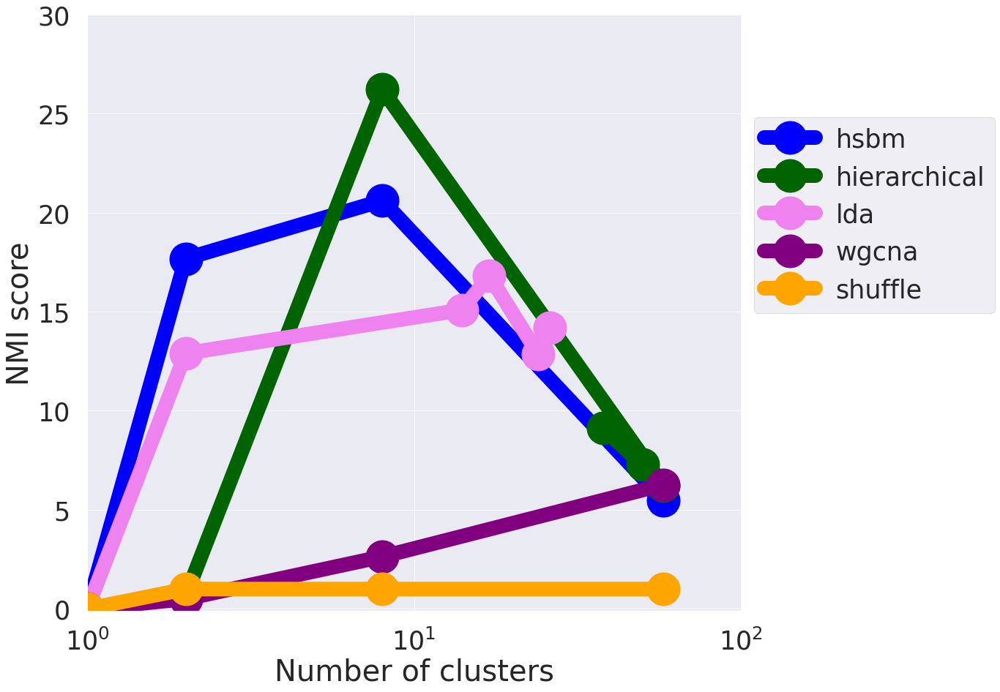

In [308]:
analysis = "all"

from hsbmpy import add_score_lines

fig=plt.figure(figsize=(20,15))
ax = fig.subplots(1)
add_score_lines(ax,scores, V="norm_V", labels=analyses[analysis])
plt.xlim(1,100)
plt.ylim(-0.1,30)
plt.show()
fig.savefig("%s/metric_scores_%s.pdf"%(directory,analysis))

### Plot Tree

In [17]:
def reindex(x):
    i=0
    last=x[0]
    new = []
    for xi in x:
        if xi == last:
            pass
        else:
            i+=1
            last=xi
        new.append(i)
    return new

from hsbmpy import get_file

df_labels = pd.DataFrame()
shape = df_clusters.dropna().shape
files = pd.read_csv("%s/%s/%s_level_2_clusters.csv"%(directory,algorithm,algorithm), header=[0]).astype(str).values.ravel()
files = files[files!="nan"]

for level in np.arange(L+1)[::-1]:
    df_clusters = pd.read_csv("%s/%s/%s_level_%d_clusters.csv"%(directory,algorithm,algorithm,level), header=[0])
    print("level ", level, "with ", df_clusters.shape[1], " clusters")
    currentlevellabels = []
    for file in files:
        s = df_clusters[df_clusters.isin([file])].any(0)
        a = s.index[s]
        currentlevellabels.append(int(a[0][8:])-1)
    df_labels.insert(0,'l%d'%level,currentlevellabels)
    del currentlevellabels
filelabels = []
filesublabels = []
for file in files:
    try:
        filelabels.append(get_file(file, df_files)[labels[0]])
    except:
        filelabels.append('unknown')
        print(*sys.exc_info())
    try:
        filesublabels.append(get_file(file, df_files)[labels[1]])
    except:
        filesublabels.append('unknown')
df_labels.insert(0,'tissue', filelabels)
df_labels.insert(0,'subtissue', filesublabels)
df_labels.sort_values(by=['tissue','subtissue'], inplace=True)
df_labels.sort_values(by=["l%d"%l for l in np.arange(L+1)[::-1]], axis=0, inplace=True)
filelabels = df_labels['tissue']
filesublabels = df_labels['subtissue']
df_labels = df_labels.apply(reindex, axis=0)
df_labels['tissue']=filelabels
df_labels['subtissue']=filesublabels
df_labels.to_csv("%s/%s/topsbm_labels.csv"%(directory,algorithm), index=False, header=True)

level  2 with  2  clusters
level  1 with  8  clusters
level  0 with  58  clusters


## Topic distributions

In [287]:
l = L-1

In [288]:
df_topics = pd.read_csv("%s/%s/%s_level_%d_topic-dist.csv"%(directory,algorithm,algorithm,l))
t_size = pd.read_csv("%s/%s/%s_level_%d_word-dist.csv"%(directory,algorithm,algorithm,l), index_col=0).apply(lambda topic: sum((topic>0).astype(int))).mean()
df_files = pd.read_csv("%s/files.dat"%directory, index_col=0).dropna(how='all', axis=0)
df_topics.set_index('doc', inplace=True)
df_topics.insert(0,'tissue','')
df_topics.drop('i_doc', axis=1, inplace=True)
label = "cancer.type"
if label not in df_files.columns:
    raise AttributeError(f"{label} not valid. Available: {df_files.columns}")
print("Working at level %d with %d topics and average size: %d"%(l,df_topics.shape[1]-1, round(t_size)))

Working at level 1 with 12 topics and average size: 250


In [289]:
for sample in df_topics.index.values:
    try:
        df_topics.at[sample,'tissue']=("%s"%(get_file(sample,df_files)[label]))
    except:
        print(*sys.exc_info())
        print(sample)
        df_topics.at[sample,'tissue']="unknown"

In [300]:
df_cmap = df_topics.sort_values(by='tissue').set_index('tissue').transpose()
df_cmap = df_cmap.subtract(df_cmap.mean(axis=1),axis=0)

network_lut = {"LUSC":[0.8768,0.5632,0.7461],
              "LUAD":[0.6384,0.3481,0.8319],
              "Discordant_LUSC":[0.9353,0.00047,0.1288]}

In [295]:
def get_box_data(topic):
    box_data = []
    tissues = df_cmap.columns.unique()
    for tissue in tissues:
        df_series = df_cmap.transpose().reset_index()[["tissue",topic]]
        df_series=df_series[df_series["tissue"]==tissue]
        box_data.append(df_series[topic].values)
    return box_data, tissues

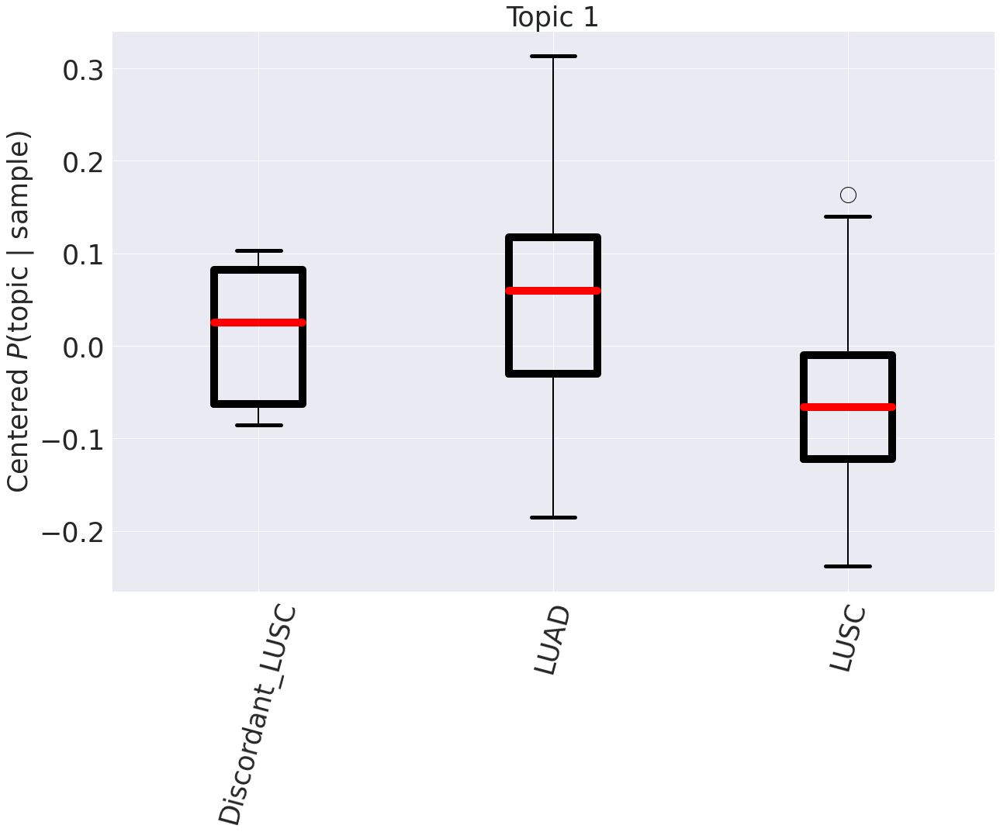

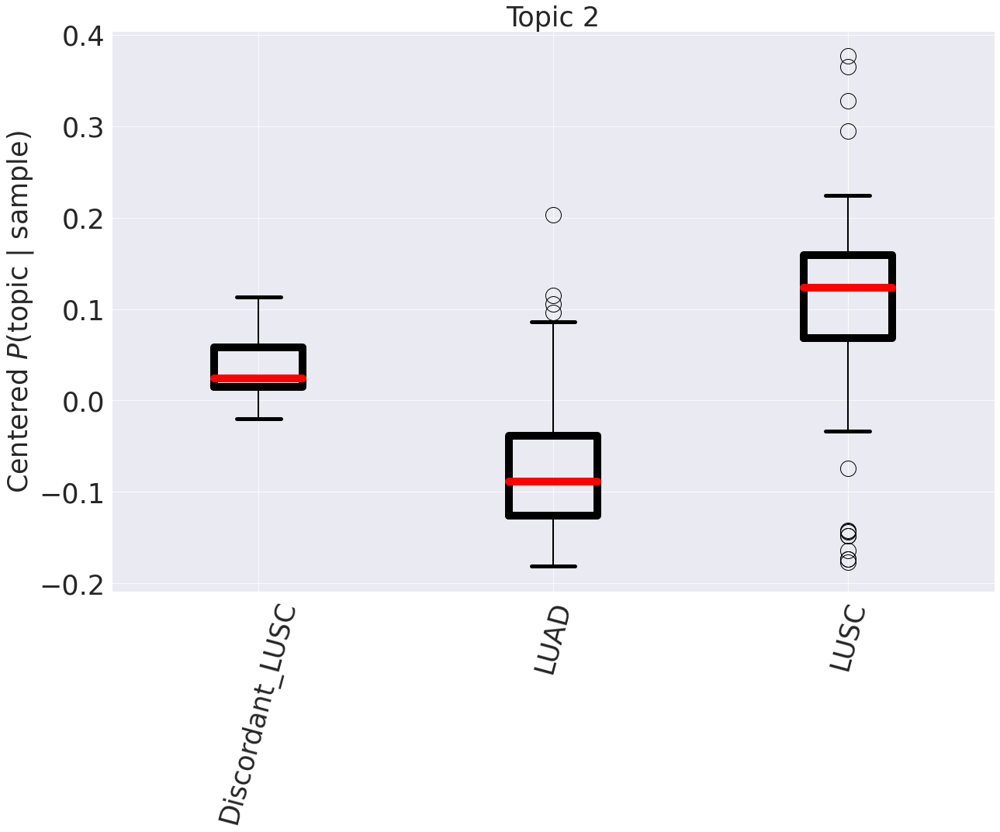

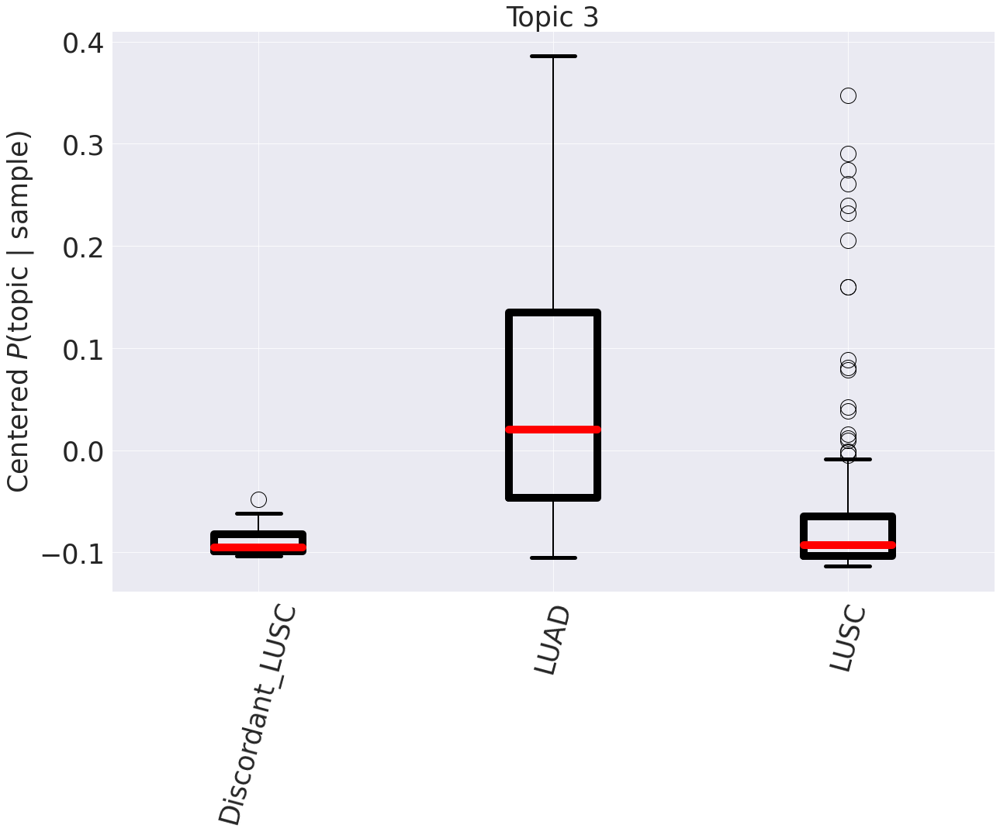

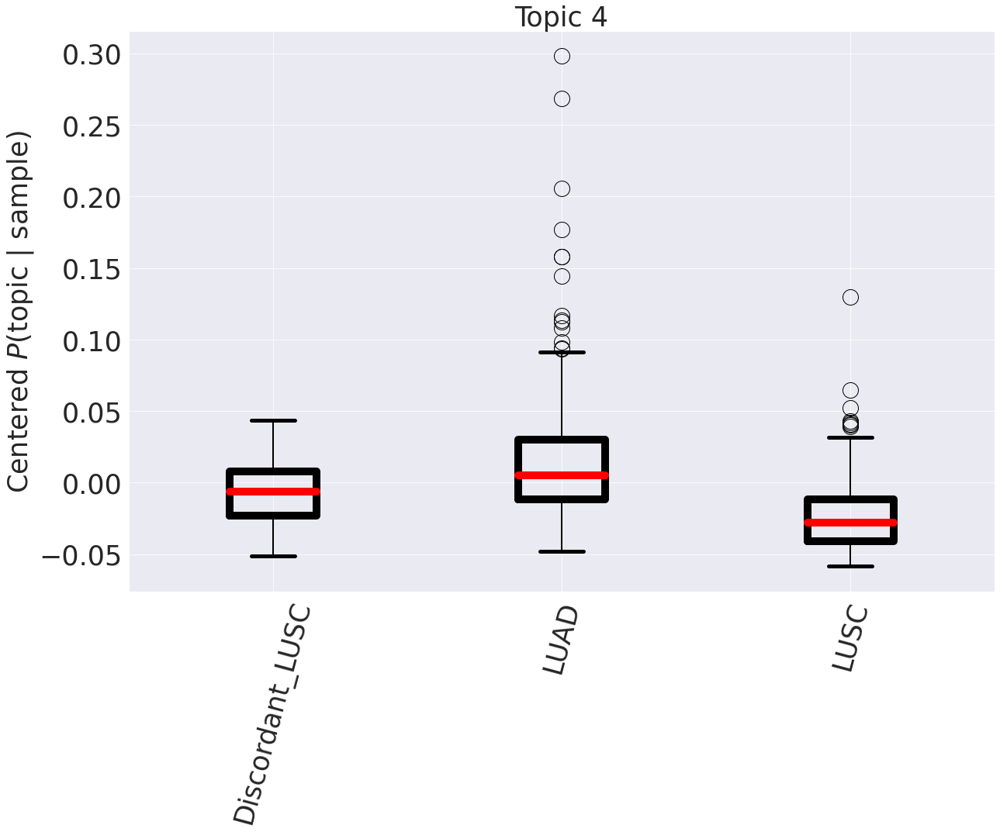

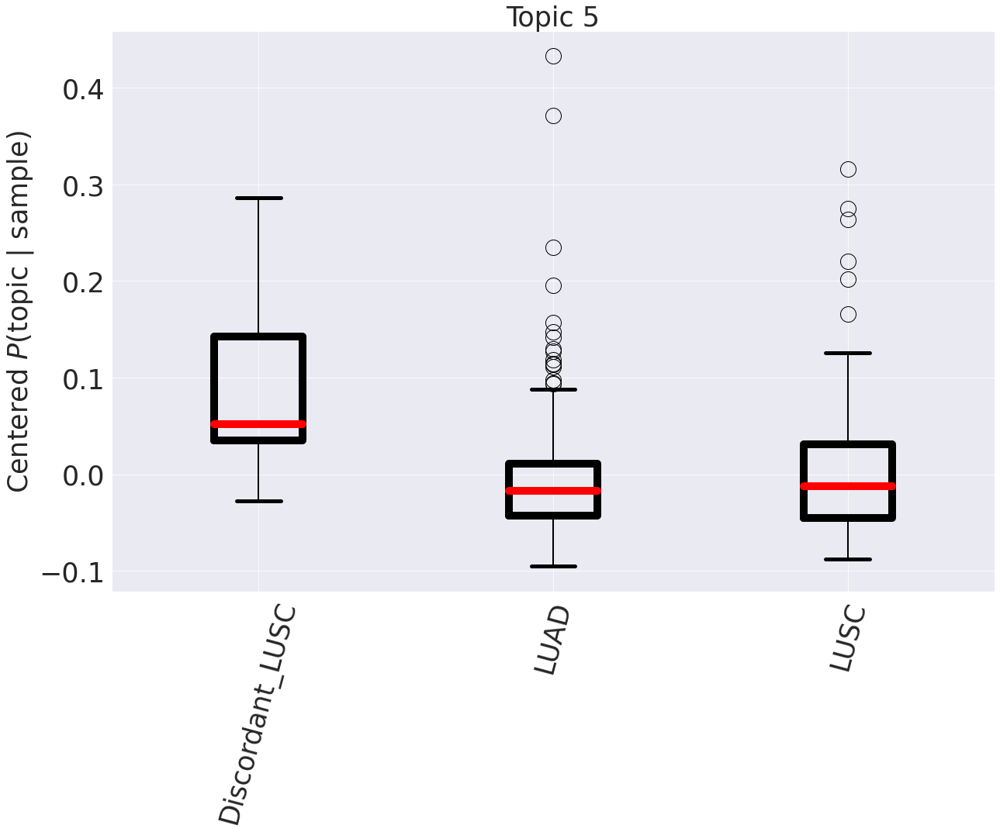

...

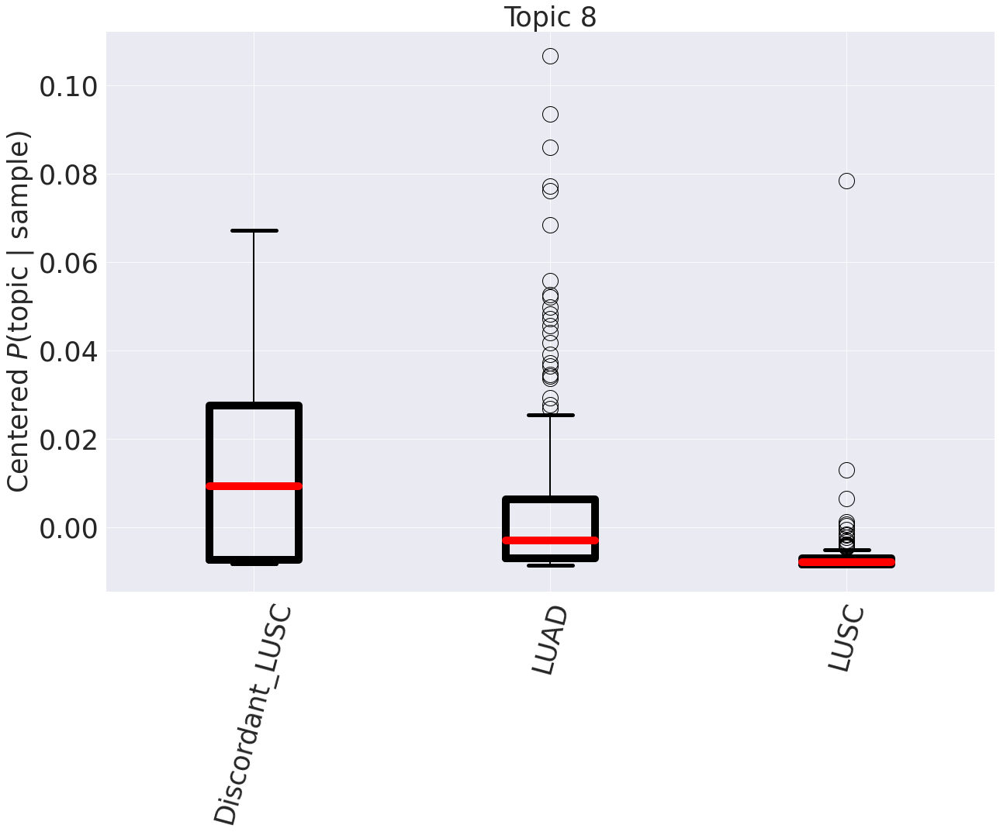

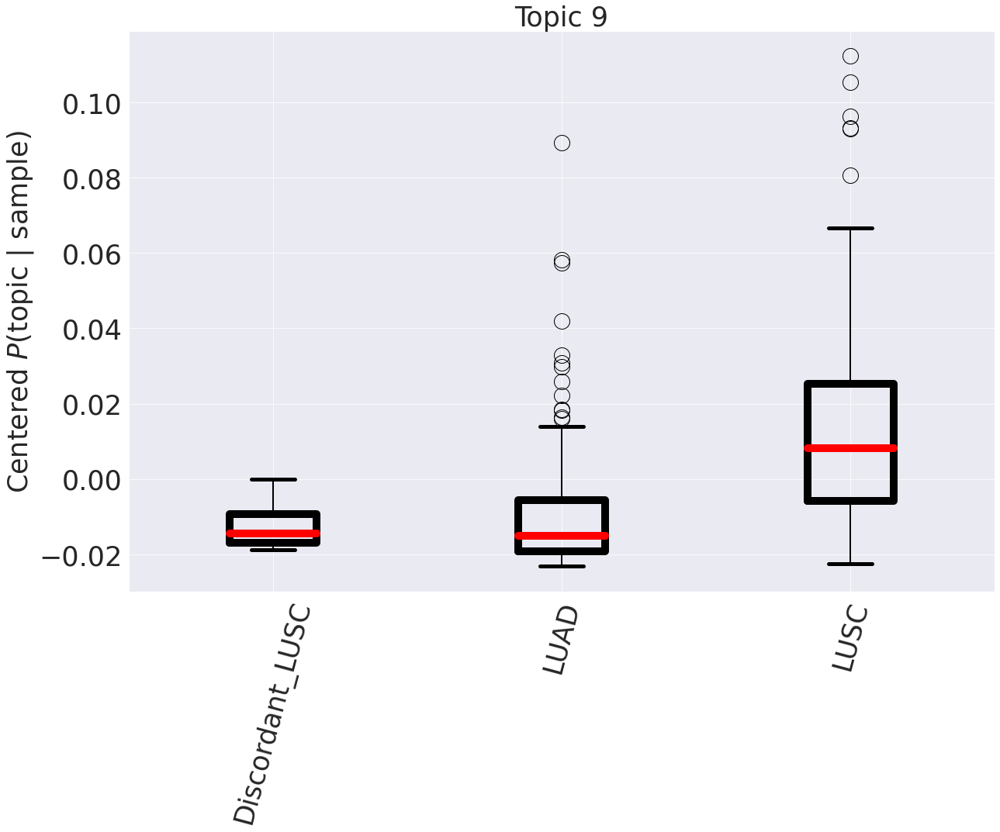

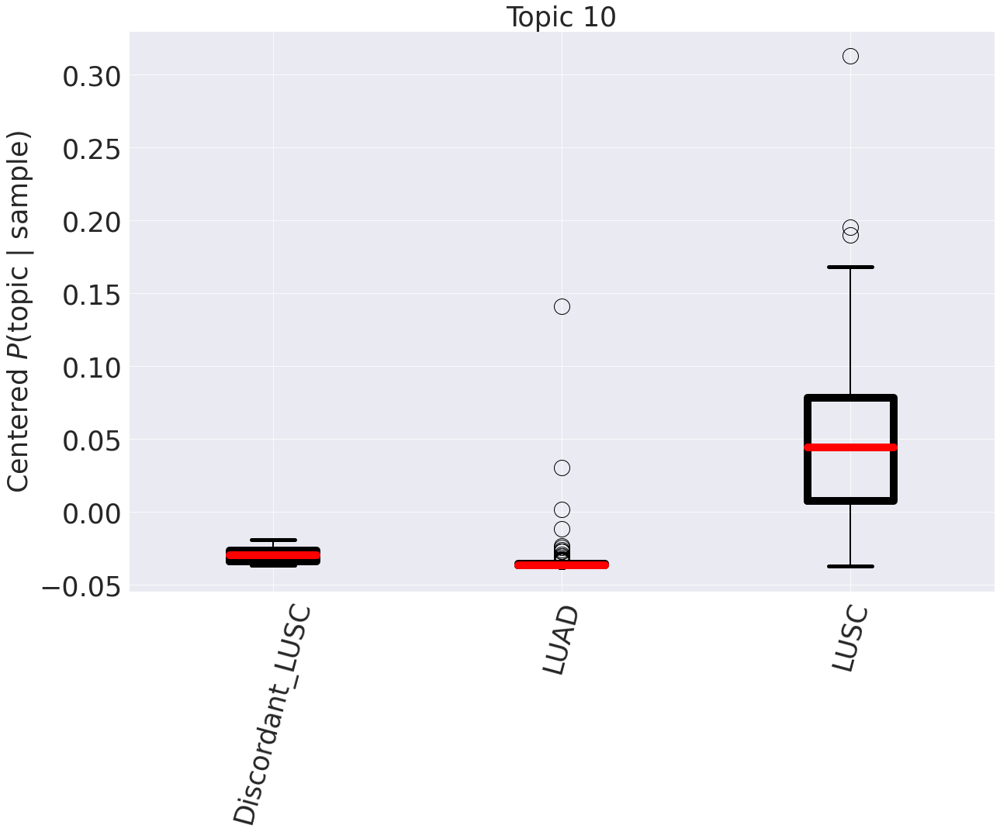

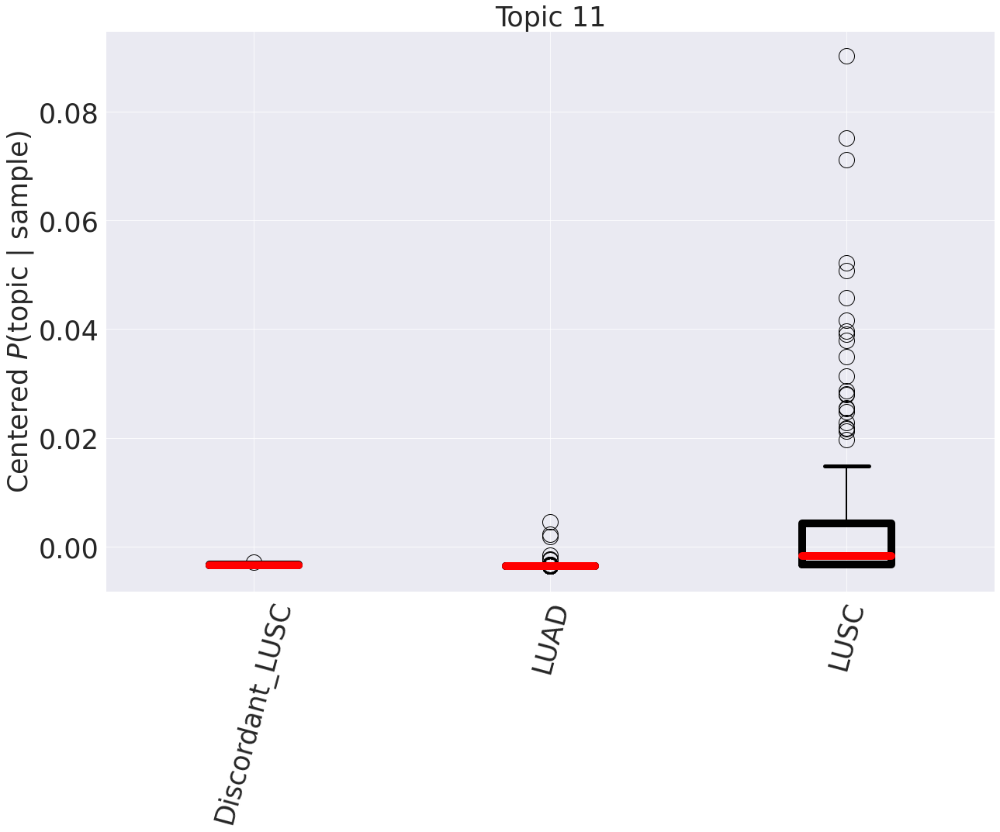

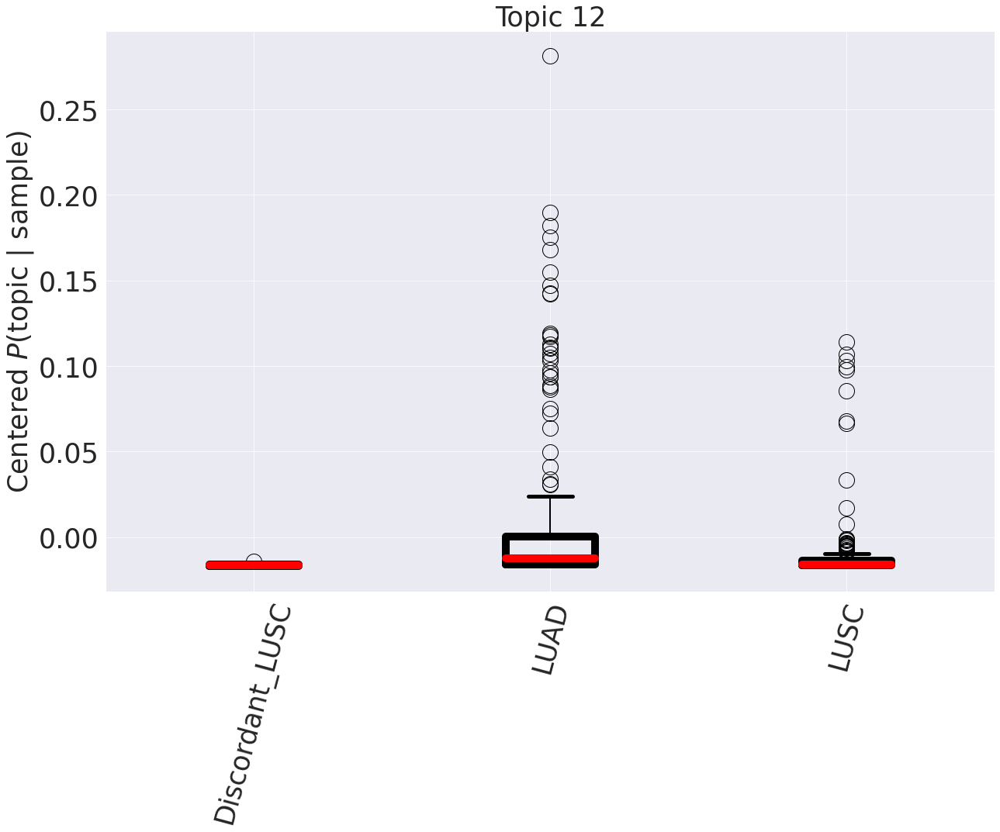

In [242]:
for topic in df_cmap.index: # all
    box_data, tissues = get_box_data(topic)

    fig, ax = plt.subplots(figsize=(18,15))
    ax.boxplot(box_data, sym="o", flierprops={"c":"gray", "ms":20, "lw":5}, boxprops = {"lw":10}, whiskerprops={"lw":2}, capprops={"lw":5}, medianprops={"c":"red", "lw":10})
    #ax.violinplot(box_data)
    
    ax.tick_params(labelsize=35)
    ax.set_title(topic, fontsize=35)

    ax.set_xticklabels(tissues, rotation = 75)
    ax.set_ylabel("Centered $P($topic $|$ sample$)$", fontsize=35)

    plt.tight_layout()
    fig.savefig(f"box_{algorithm}_{l}{topic}.pdf")
    plt.show()

In [296]:
l = L-1
df_topics = pd.read_csv("%s/%s/%s_level_%d_topic-dist.csv"%(directory,algorithm, algorithm,l))
df_topics.drop('i_doc', axis=1, inplace=True)
df_topics.set_index('doc', inplace=True)
order = df_topics.mean(0).sort_values(ascending=False)
df_topics = df_topics.reindex(columns=order.index)
df_topics.columns = ["Topic %d"%(t+1) for t,_ in enumerate(df_topics.columns)]
for sample in df_topics.index.values:
    df_topics.at[sample,'tissue']="%s"%(get_file(sample,df_files)[label])

Discordant_LUSC
LUAD
LUSC


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Attempted to set non-positive left xlim on a log-scaled axis.
Invalid limit will be ignored.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:28: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.


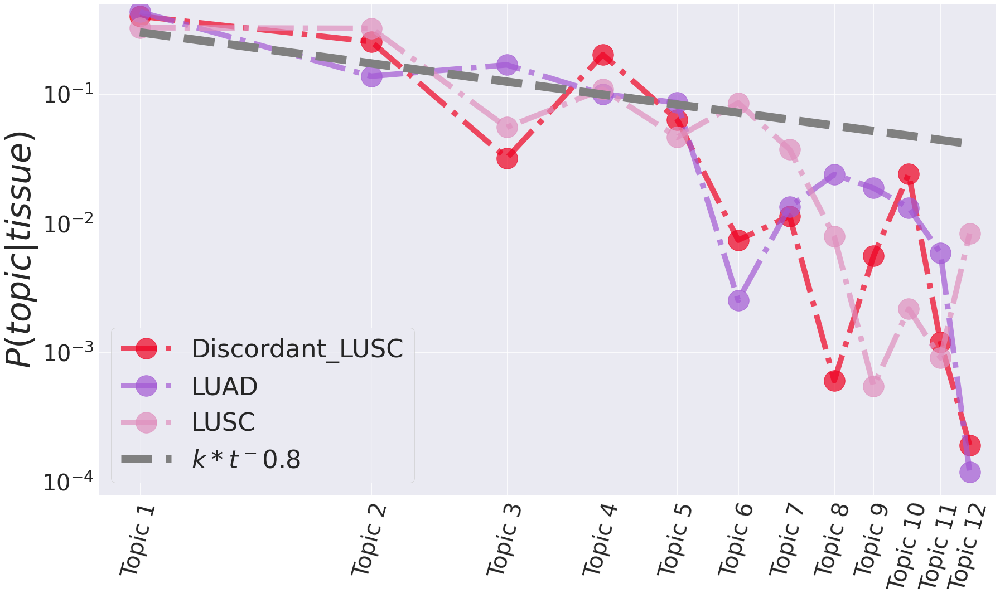

In [301]:
log = True

fig,ax = plt.subplots(figsize=(25,15))
for tissue in np.sort(df_topics['tissue'].unique()):
    print(tissue)
    marker, c, ls = get_tissue_style(tissue)
    try:
        ax.plot(np.arange(1, df_topics.shape[1],step=1),df_topics[df_topics['tissue']==tissue].mean(axis=0),ls=ls,marker=marker, lw=10, ms=75, alpha=0.7, label=tissue, c=network_lut[tissue])
    except:
        print(*sys.exc_info())
ax.set_ylabel("$P(topic | tissue)$", fontsize=60)
#plt.xscale('log')
#plt.yscale('log')

ax.set_xticks(np.arange(1, df_topics.shape[1],step=2))
ax.set_xticklabels(df_topics.columns[:-1:2], rotation=45)
ax.tick_params(labelsize=45)

if log:
    ax.set_xscale("log")
    ax.set_yscale("log")
    ax.set_xticks(np.arange(1, df_topics.shape[1],step=1))
    ax.set_xticklabels(df_topics.columns[:-1], rotation=75)
    ax.tick_params(labelsize=40)
    ax.set_xlim(0,df_topics.shape[1])
    
ax.plot(np.arange(1, df_topics.shape[1]),3e-1*np.power(np.arange(1, df_topics.shape[1]),-0.8), lw=15, c="gray", ls="--", label="$k*t^-0.8$")
ax.set_ylim(0,0.5)
    
# Shrink current axis by 20%
#box = ax.get_position()
#ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
#ax.legend(fontsize=25, ncol=1, loc='center left', bbox_to_anchor=(1, 0.5))
ax.legend(fontsize=45, ncol=1, loc='best')


plt.tight_layout()
plt.show()
fig.savefig("%s/%s/lifeplot_level%d%s.pdf"%(directory,algorithm,l,"_log" if log else ""))

# Unified lung

In [18]:
level = 1
algorithm = 'topsbm'
directory = "unified_lung"
L=get_max_available_L(directory, algorithm)
df_clusters = pd.read_csv("%s/%s/%s_level_%d_clusters.csv"%(directory,algorithm,algorithm,L), header=[0])
df_clusters.head()

,Cluster 1,Cluster 2
0,TCGA-64-1680-01A-02R-0946-07,TCGA-38-4625-01A-01R-1206-07
1,TCGA-66-2759-01A-01R-0851-07,TCGA-38-4625-01A-01R-1206-07-1
2,TCGA-NC-A5HI-01A-11R-A26W-07,NaN
3,TCGA-60-2721-01A-01R-0851-07,NaN
4,TCGA-63-A5MG-01A-12R-A27Q-07,NaN


In [19]:
df_files = pd.read_csv("%s/files.dat"%directory, index_col=[0], header=[0]).dropna(axis=1, how='all').dropna(axis=0, how='all')
samples = pd.read_csv("%s/%s/%s_level_0_clusters.csv"%(directory,algorithm,algorithm), header=[0]).astype(str).values.ravel()
samples=samples[samples!="nan"]
df_files = df_files.reindex(index=samples).dropna(how="all", axis=0).fillna("unknown")
labels = df_files.columns
labels

Index(['primary_site', 'status', 'dataset', 'tissue_hd', 'Subtype', 'Type',
       'file_name', 'cases.0.demographic.days_to_birth',
       'cases.0.demographic.days_to_death', 'cases.0.demographic.gender',
       'cases.0.demographic.vital_status',
       'cases.0.diagnoses.0.age_at_diagnosis',
       'cases.0.diagnoses.0.last_known_disease_status',
       'cases.0.diagnoses.0.morphology',
       'cases.0.diagnoses.0.primary_diagnosis',
       'cases.0.diagnoses.0.tissue_or_organ_of_origin',
       'cases.0.diagnoses.0.tumor_grade', 'cases.0.diagnoses.0.tumor_stage',
       'cases.0.exposures.0.cigarettes_per_day',
       'cases.0.exposures.0.years_smoked', 'cases.0.project.disease_type',
       'cases.0.project.primary_site', 'cases.0.project.project_id',
       'cases.0.samples.0.longest_dimension', 'cases.0.submitter_id'],
      dtype='object')

In [20]:
labels=['Type']

In [21]:
df_files["Type"].unique()

array(['LUSC', 'healthy', 'LUAD', 'Discordant_LUSC'], dtype=object)

True Type 3


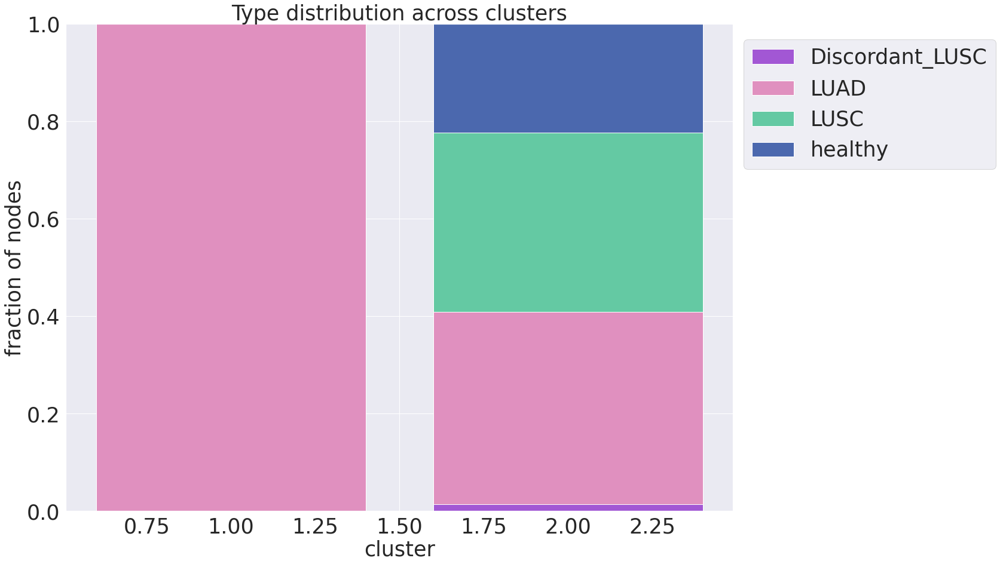

True Type 2


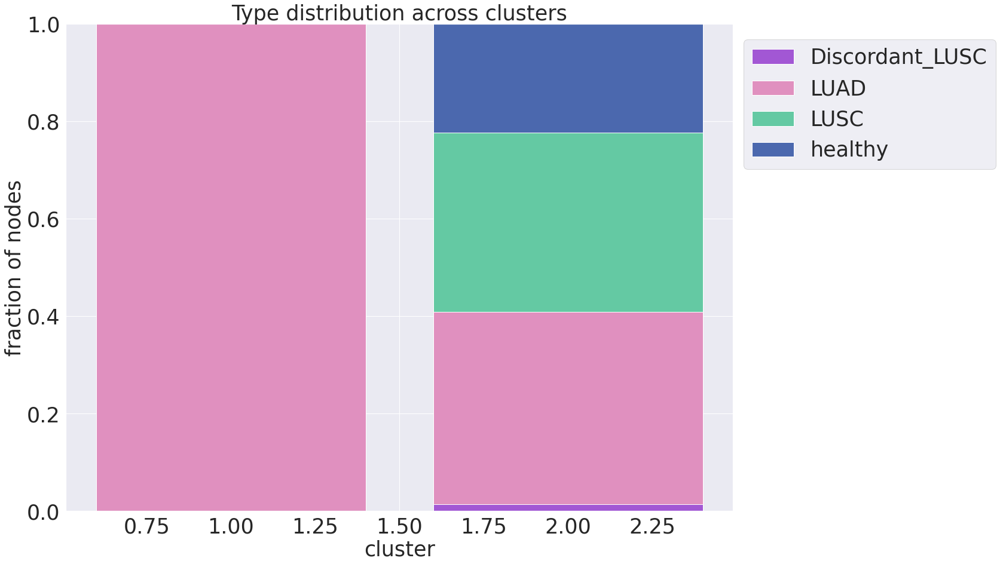

True Type 1


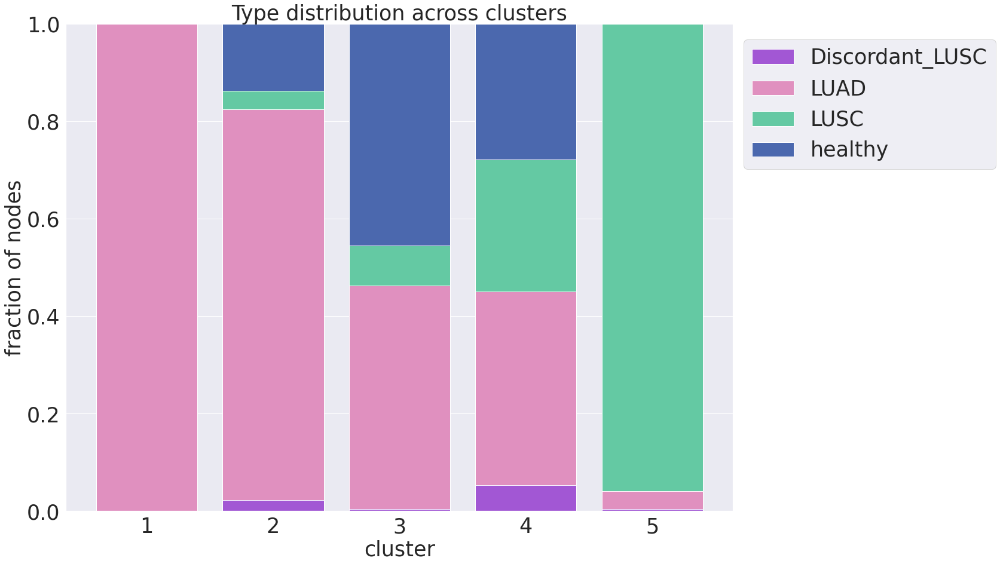

True Type 0


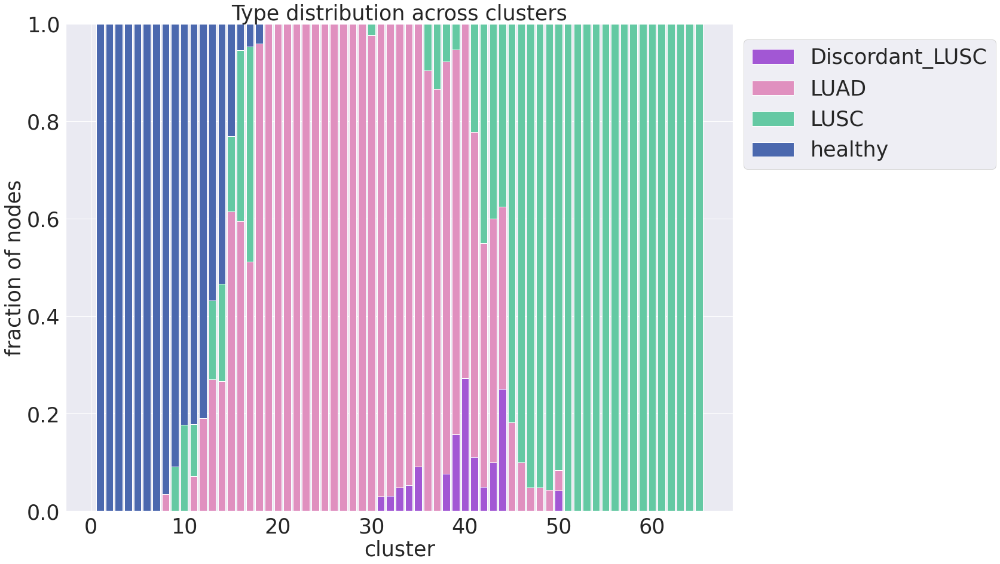

False Type 3


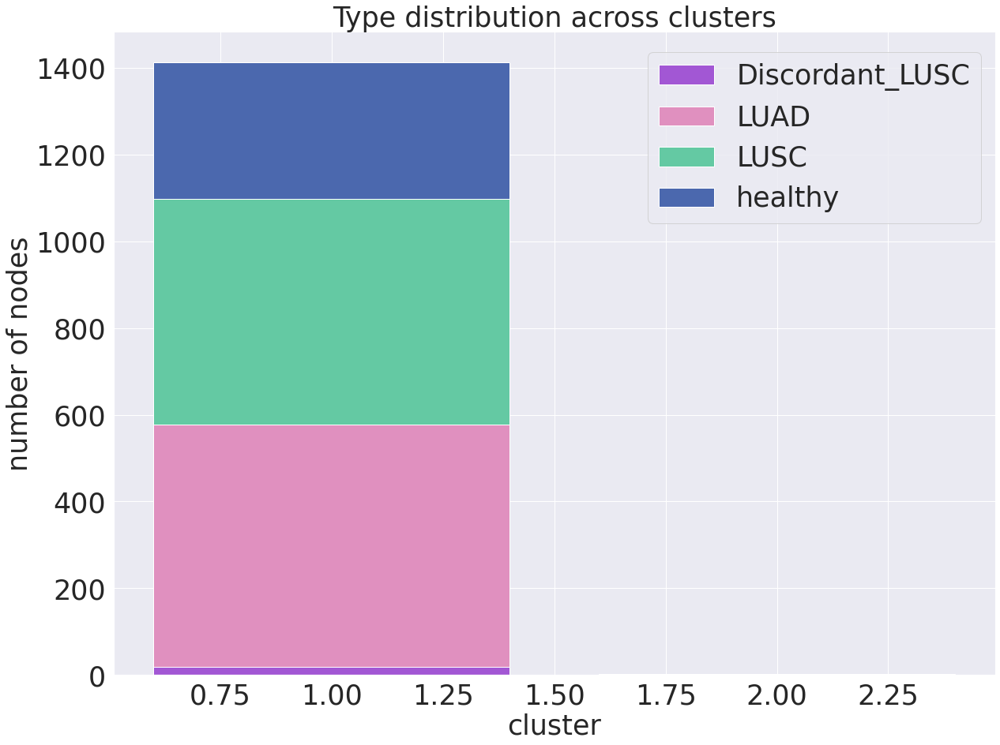

False Type 2


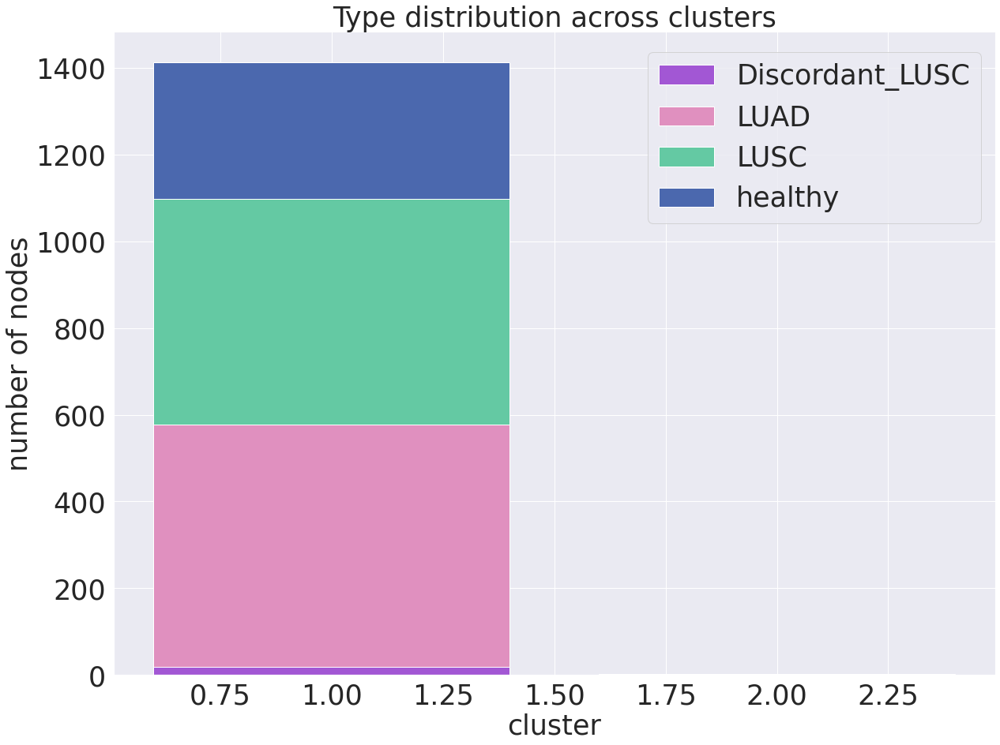

False Type 1


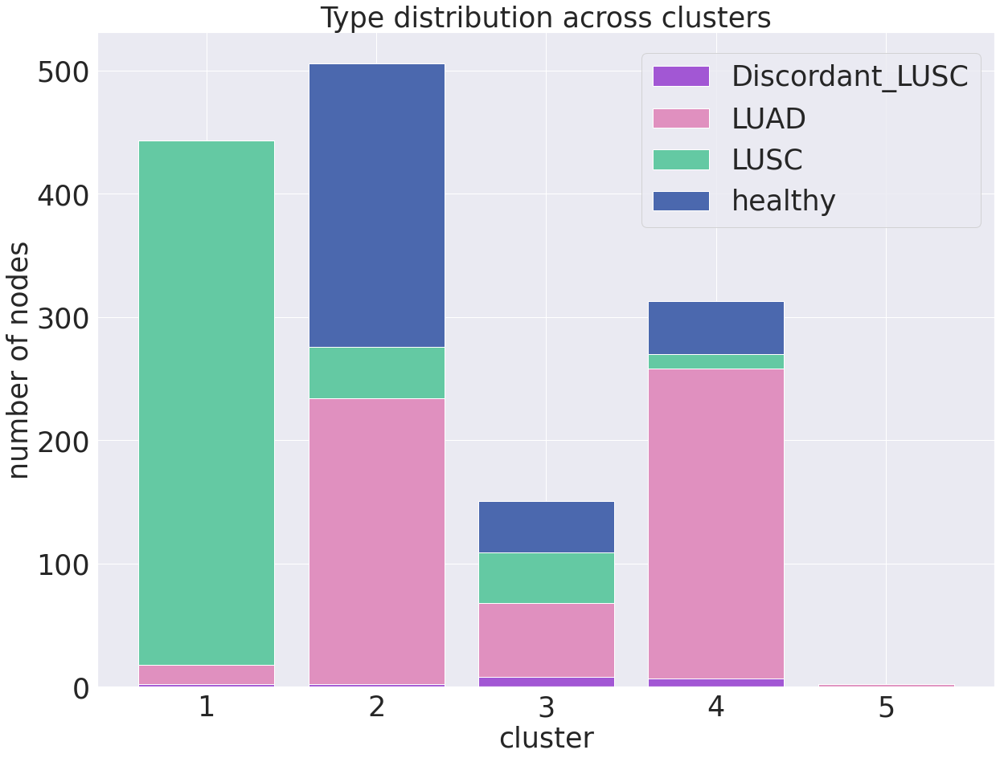

False Type 0


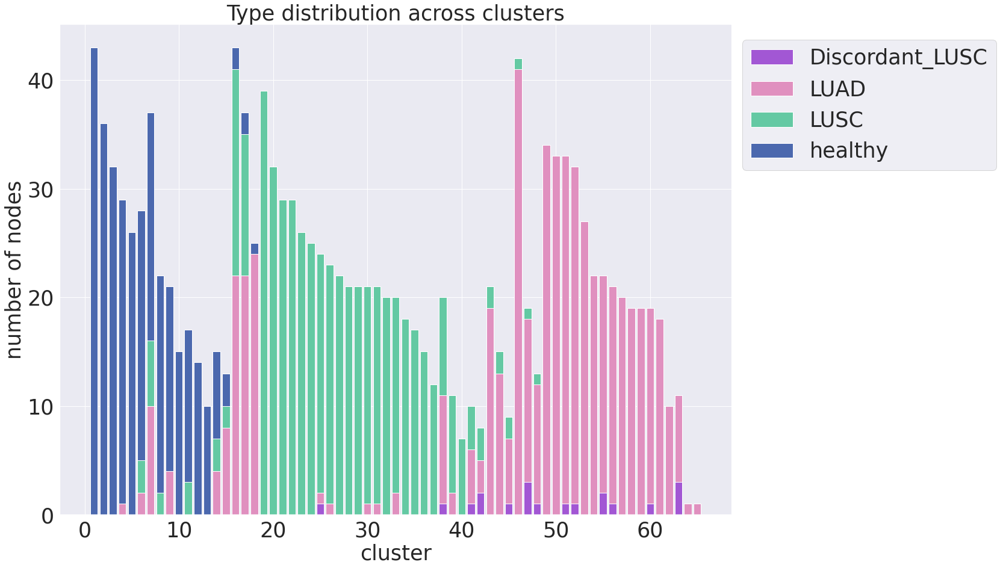

In [22]:
clusteranalysis(directory, labels)

### Plot Tree

In [23]:
def reindex(x):
    i=0
    last=x[0]
    new = []
    for xi in x:
        if xi == last:
            pass
        else:
            i+=1
            last=xi
        new.append(i)
    return new



df_labels = pd.DataFrame()
shape = df_clusters.dropna().shape
files = pd.read_csv("%s/%s/%s_level_3_clusters.csv"%(directory,algorithm,algorithm), header=[0]).astype(str).values.ravel()
files = files[files!="nan"]

for level in np.arange(L+1)[::-1]:
    df_clusters = pd.read_csv("%s/%s/%s_level_%d_clusters.csv"%(directory,algorithm,algorithm,level), header=[0])
    print("level ", level, "with ", df_clusters.shape[1], " clusters")
    currentlevellabels = []
    for file in files:
        s = df_clusters[df_clusters.isin([file])].any(0)
        a = s.index[s]
        currentlevellabels.append(int(a[0][8:])-1)
    df_labels.insert(0,'l%d'%level,currentlevellabels)
    del currentlevellabels
filelabels = []
filesublabels = []
for file in files:
    try:
        filelabels.append(get_file(file, df_files)[labels[0]])
    except:
        filelabels.append('unknown')
        print(*sys.exc_info())
    try:
        filesublabels.append(get_file(file, df_files)[labels[1]])
    except:
        filesublabels.append('unknown')

df_labels.insert(0,'tissue', filelabels)
df_labels.insert(0,'subtissue', filesublabels)
df_labels.sort_values(by=['tissue','subtissue'], inplace=True)
df_labels.sort_values(by=["l%d"%l for l in np.arange(L+1)[::-1]], axis=0, inplace=True)
filelabels = df_labels['tissue']
filesublabels = df_labels['subtissue']
df_labels = df_labels.apply(reindex, axis=0)
df_labels['tissue']=filelabels
df_labels['subtissue']=filesublabels
df_labels.to_csv("%s/%s/topsbm_labels.csv"%(directory,algorithm), index=False, header=True)

level  3 with  2  clusters
level  2 with  2  clusters
level  1 with  5  clusters
level  0 with  65  clusters
